# TREND usage in healthy human prefrontal cortex (DLPFC)

In [1]:
import torch
import numpy as np
from scipy.io import mmread
from scipy.stats import spearmanr, chisquare, chi2_contingency
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from plotnine import *

import scanpy as sc

from isosde.utils import get_cov_sp, counts_to_ratios, load_visium_sp_meta

In [2]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/human_dlpfc/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

In [3]:
import os
if not os.path.exists(f"{res_dir}/figures/source_data/"):
    os.makedirs(f"{res_dir}/figures/source_data/")

## Spatial variability (SV) tests

### Visualize SV test results

#### Load results of all samples

In [4]:
# process all 12 DLPFC samples
sample_list = [
    '151507', '151508', '151509', '151510', 
    '151669', '151670', '151671', '151672', 
    '151673', '151674', '151675', '151676'
]
df_sv_pval = []

for sample_id in sample_list:
    _df = pd.read_csv(f"{res_dir}/sv_results/{sample_id}.sv_combined_{date}.csv", index_col=None)
    _df['sample_id'] = sample_id

    # set significance threshold
    _df['is_trend_svs'] = _df['padj_hsic-ir'] < 0.05
    _df['is_trend_sve'] = _df['padj_hsic-gc'] < 0.05
    _df['is_trend_expressed'] = _df['count_avg'] > 0.5

    df_sv_pval.append(_df)

# merge SV results for all samples and reset the index
df_sv_pval = pd.concat(df_sv_pval).reset_index(drop=True)

In [5]:
df_sv_pval.groupby(['sample_id', 'is_trend_svs']).size()

sample_id  is_trend_svs
151507     False           4323
           True              99
151508     False           3967
           True              64
151509     False           4452
           True             148
151510     False           4318
           True              74
151669     False           5107
           True              41
151670     False           4826
           True              50
151671     False           5237
           True              77
151672     False           4874
           True              55
151673     False           5344
           True             358
151674     False           6003
           True             390
151675     False           4907
           True             295
151676     False           5222
           True             235
dtype: int64

In [6]:
df_sv_pval.groupby(['sample_id', 'is_trend_sve']).size()

sample_id  is_trend_sve
151507     False            598
           True            3824
151508     False            559
           True            3472
151509     False            461
           True            4139
151510     False            573
           True            3819
151669     False            300
           True            4848
151670     False            357
           True            4519
151671     False            267
           True            5047
151672     False            405
           True            4524
151673     False            208
           True            5494
151674     False            181
           True            6212
151675     False            171
           True            5031
151676     False            215
           True            5242
dtype: int64

#### Rank SVS genes based on re-occurrence and min-pval

In [7]:
df_svs_gene = df_sv_pval[df_sv_pval['is_trend_svs']]

# find the sample with minimal p-value and extract the corresponding rows
idx_min_padj = df_svs_gene.groupby("gene")["pvalue_hsic-ir"].idxmin()
minimal_rows = df_svs_gene.loc[idx_min_padj]

# group by gene, count occurrence, and aggregate all info
aggregated = df_svs_gene.groupby("gene").agg(
    occurrence=("gene", "size"),  # Count occurrences
    is_trend_svs_in=("sample_id", lambda x: list(x.unique())),  # Collect unique sample IDs
)

df_svs_gene = aggregated.join(minimal_rows.set_index("gene")).sort_values(
    by=['occurrence', 'pvalue_hsic-ir'], ascending=[False, True]
)[['occurrence', 'is_trend_svs_in', 'sample_id', 
   'perplexity', 'pct_spot_on', 'count_avg', 'major_ratio_avg', 'is_trend_expressed',
   'pvalue_hsic-ir', 'pvalue_hsic-ic', 'pvalue_hsic-gc', 'pvalue_spark-x', 
]]

df_svs_gene.head()

,occurrence,is_trend_svs_in,sample_id,perplexity,pct_spot_on,count_avg,major_ratio_avg,is_trend_expressed,pvalue_hsic-ir,pvalue_hsic-ic,pvalue_hsic-gc,pvalue_spark-x
gene,,,,,,,,,,,,
MT-CO1,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151671,3.881692,1.000000,412.418500,0.319246,True,0.000000e+00,0.0,0.000000e+00,1.759785e-284
MT-ND1,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151671,1.935831,0.999513,104.846720,0.626993,True,0.000000e+00,0.0,0.000000e+00,2.083593e-289
MT-ND2,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151671,1.929004,0.999513,81.730900,0.633615,True,1.093325e-278,0.0,0.000000e+00,5.328852e-289
MAP1B,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151675,1.719451,0.925947,4.844933,0.809918,True,8.064828e-88,0.0,0.000000e+00,2.576014e-145
HSP90AA1,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151676,2.040794,0.965607,6.109538,0.783670,True,1.656299e-57,0.0,1.732659e-275,2.221111e-123


In [8]:
(df_svs_gene['occurrence'] >= 2).sum(), df_svs_gene.shape[0]

(346, 861)

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


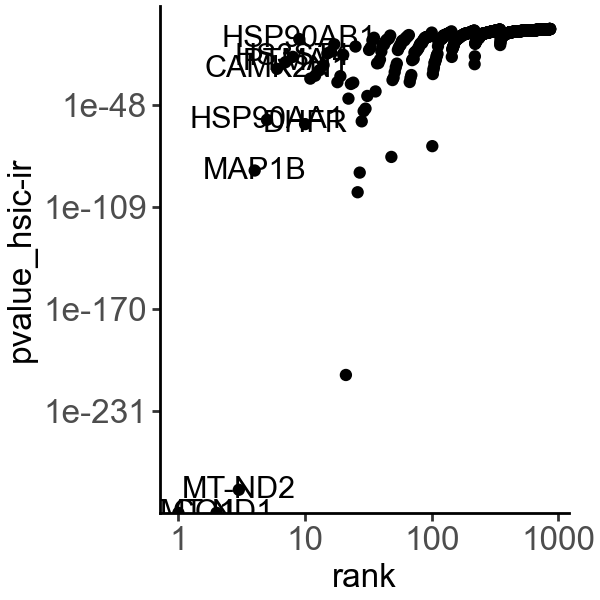

In [9]:
df = df_svs_gene.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_hsic-ir')) +
        geom_point() + 
        geom_text(df.head(n = 10), aes(label = 'gene')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        theme_classic() + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### Rank SVE genes based on re-occurrence and min-pval

In [10]:
df_sve_gene = df_sv_pval[df_sv_pval['is_trend_sve']]

# find the sample with minimal p-value and extract the corresponding rows
idx_min_padj = df_sve_gene.groupby("gene")["pvalue_hsic-gc"].idxmin()
minimal_rows = df_sve_gene.loc[idx_min_padj]

# group by gene, count occurrence, and aggregate all info
aggregated = df_sve_gene.groupby("gene").agg(
    occurrence=("gene", "size"),  # Count occurrences
    is_trend_sve_in=("sample_id", lambda x: list(x.unique())),  # Collect unique sample IDs
)

df_sve_gene = aggregated.join(minimal_rows.set_index("gene")).sort_values(
    by=['occurrence', 'pvalue_hsic-ir'], ascending=[False, True]
)[['occurrence', 'is_trend_sve_in', 'sample_id', 
   'perplexity', 'pct_spot_on', 'count_avg', 'major_ratio_avg', 'is_trend_expressed',
   'pvalue_hsic-ir', 'pvalue_hsic-ic', 'pvalue_hsic-gc', 'pvalue_spark-x', 
]]

df_sve_gene.head()

,occurrence,is_trend_sve_in,sample_id,perplexity,pct_spot_on,count_avg,major_ratio_avg,is_trend_expressed,pvalue_hsic-ir,pvalue_hsic-ic,pvalue_hsic-gc,pvalue_spark-x
gene,,,,,,,,,,,,
MT-CO1,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151507,3.844661,1.000000,210.302890,0.317379,True,5.606627e-300,0.000000e+00,0.000000e+00,3.240385e-54
SEPTIN8,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151673,2.456547,0.616653,1.136576,0.576161,True,4.633762e-210,0.000000e+00,1.897555e-148,2.489650e-53
RNF130,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151673,2.556894,0.367134,0.612806,0.579372,True,1.064987e-79,1.644897e-245,2.297385e-145,7.555502e-48
MT-ND1,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151507,1.898902,0.999290,62.468530,0.659637,True,6.724246e-73,0.000000e+00,0.000000e+00,6.310103e-82
MAP1B,12,"[151507, 151508, 151509, 151510, 151669, 15167...",151507,1.925688,0.848557,3.600568,0.728641,True,2.377634e-69,0.000000e+00,0.000000e+00,5.786514e-60


In [11]:
(df_sve_gene['occurrence'] >= 2).sum()

5877

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


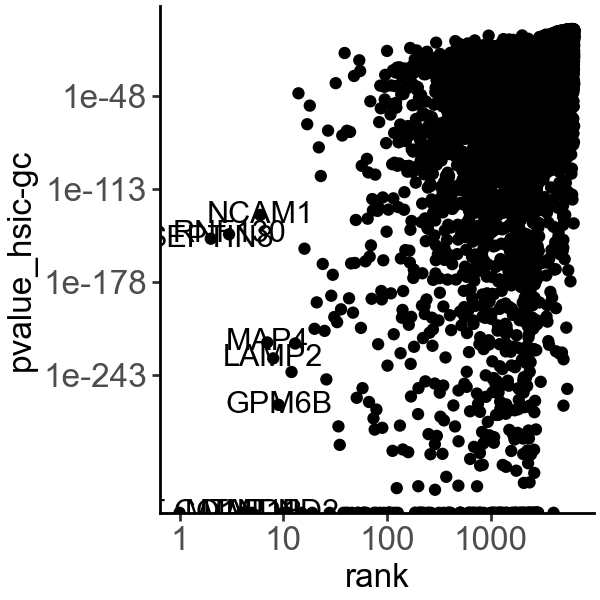

In [12]:
df = df_sve_gene.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_hsic-gc')) +
        geom_point() + 
        geom_text(df.head(n = 10), aes(label = 'gene')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        theme_classic() + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### Plot SVS and SVE reoccurrence

In [13]:
# count gene re-occurrence in each group
_df1 = df_svs_gene.groupby('occurrence').size().reset_index(name = 'count')
_df2 = df_sve_gene.groupby('occurrence').size().reset_index(name = 'count')
_df1['group'] = 'SVS'
_df2['group'] = 'SVE'

# merge SVS and SVE results
df = pd.concat([_df1, _df2])
df['x'] = df['occurrence'].apply(lambda x: x if x<=8 else '8+')

# aggregate counts for 5+ genes
df = df.groupby(['group', 'x']).agg(
    count = ('count', 'sum')
).reset_index()
df['x'] = pd.Categorical(df['x'])

# compute the proportion
df['proportion'] = df['count']/ df.groupby("group")["count"].transform("sum")

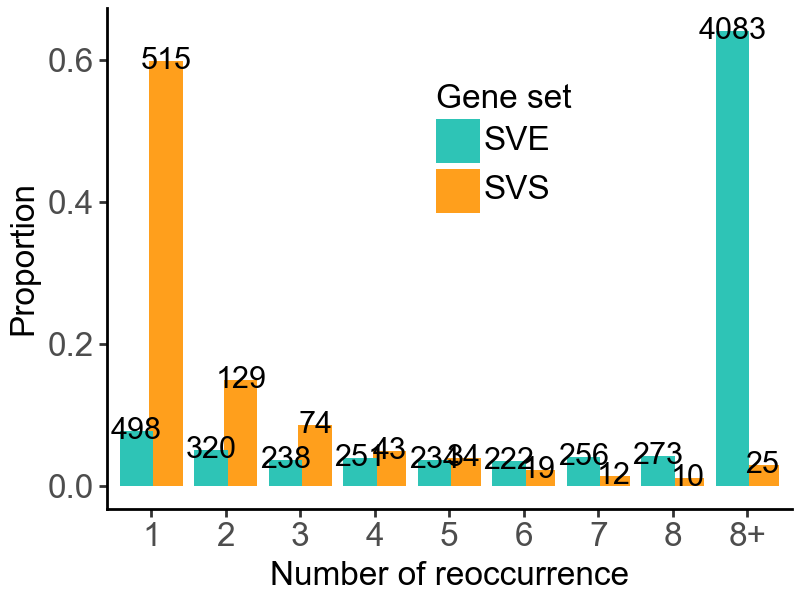

In [14]:
(
    ggplot(df, aes(x = 'x', y = 'proportion', fill = 'group')) + 
        geom_bar(stat = 'identity', position = position_dodge(width = 0.8)) + 
        geom_text(aes(label = 'count'), position = position_dodge(width = 0.8)) + 
        labs(x = 'Number of reoccurrence', y = 'Proportion', fill = 'Gene set') + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(4,3),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (0.6,0.8)
        )
)

#### Save the aggregated results

In [15]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

df_svs_gene.to_csv(f"{res_dir}/trend_svs_dlpfc_{date}.csv")
df_sve_gene.to_csv(f"{res_dir}/trend_sve_dlpfc_{date}.csv")

### Check SV agreements

#### Between replicates

In [16]:
df_stat_rep = []
for id1, id2 in [
    ('151507', '151508'), ('151509', '151510'),
    ('151669', '151670'), ('151671', '151672'), 
    ('151673', '151674'), ('151675', '151676'),
]:
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/sv_results/{id1}.sv_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/sv_results/{id2}.sv_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = 'gene')

    # separate genes into three groups by expression
    _g1 = _df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 1
    _g2 = (_df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 0.5) & (~_g1)
    _g3 = (~_g1) & (~_g2)

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['perplexity', 'pvalue_hsic-ir', 'pvalue_hsic-gc', 'pvalue_hsic-ic', 'pvalue_spark-x']:
        for _g, _gname in zip(
            [_g1, _g2, _g3], ['High', 'Mid', 'Low']
        ):
            _df = _df_pair.loc[_g]
            _df_stat.append({
                'stat': _stat,
                'group': _gname,
                'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
                'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
            })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_rep.append(_df_stat)

df_stat_rep = pd.concat(df_stat_rep)
df_stat_rep['group'] = pd.Categorical(df_stat_rep['group'], ordered=True, categories=['Low', 'Mid', 'High'])
df_stat_rep['stat'] = pd.Categorical(df_stat_rep['stat'], ordered=True, categories=[
    'perplexity', 'pvalue_hsic-gc', 'pvalue_spark-x', 'pvalue_hsic-ic', 'pvalue_hsic-ir']
).rename_categories({
    'perplexity': 'Perplexity', 
    'pvalue_hsic-gc': 'HSIC-GC', 
    'pvalue_spark-x': 'SPARK-X', 
    'pvalue_hsic-ic': 'HSIC-IC', 
    'pvalue_hsic-ir': 'HSIC-IR'
    
})

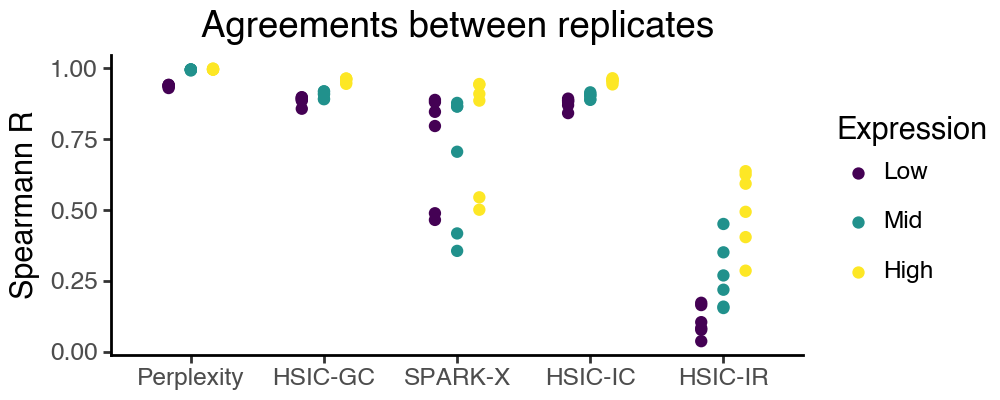

In [17]:
(
    ggplot(df_stat_rep, aes(x = 'stat', y = 'spearmannr', group = 'group', color = 'group')) + 
        geom_point(position = position_dodge(width = 0.5)) + 
        labs(x = '', y = 'Spearmann R', color = 'Expression', title = 'Agreements between replicates') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Between positions of the same individual

In [18]:
df_stat_pos = []
for id1, id2 in (
    list(itertools.product(('151507', '151508'), ('151509', '151510'))) + \
    list(itertools.product(('151669', '151670'), ('151671', '151672'))) + \
    list(itertools.product(('151673', '151674'), ('151675', '151676')))
):
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/sv_results/{id1}.sv_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/sv_results/{id2}.sv_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = 'gene')

    # separate genes into three groups by expression
    _g1 = _df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 1
    _g2 = (_df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 0.5) & (~_g1)
    _g3 = (~_g1) & (~_g2)

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['perplexity', 'pvalue_hsic-ir', 'pvalue_hsic-gc', 'pvalue_hsic-ic', 'pvalue_spark-x']:
        for _g, _gname in zip(
            [_g1, _g2, _g3], ['High', 'Mid', 'Low']
        ):
            _df = _df_pair.loc[_g]
            _df_stat.append({
                'stat': _stat,
                'group': _gname,
                'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
                'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
            })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_pos.append(_df_stat)

df_stat_pos = pd.concat(df_stat_pos)
df_stat_pos['group'] = pd.Categorical(df_stat_pos['group'], ordered=True, categories=['Low', 'Mid', 'High'])
df_stat_pos['stat'] = pd.Categorical(df_stat_pos['stat'], ordered=True, categories=[
    'perplexity', 'pvalue_hsic-gc', 'pvalue_spark-x', 'pvalue_hsic-ic', 'pvalue_hsic-ir']
).rename_categories({
    'perplexity': 'Perplexity', 
    'pvalue_hsic-gc': 'HSIC-GC', 
    'pvalue_spark-x': 'SPARK-X', 
    'pvalue_hsic-ic': 'HSIC-IC', 
    'pvalue_hsic-ir': 'HSIC-IR'
    
})

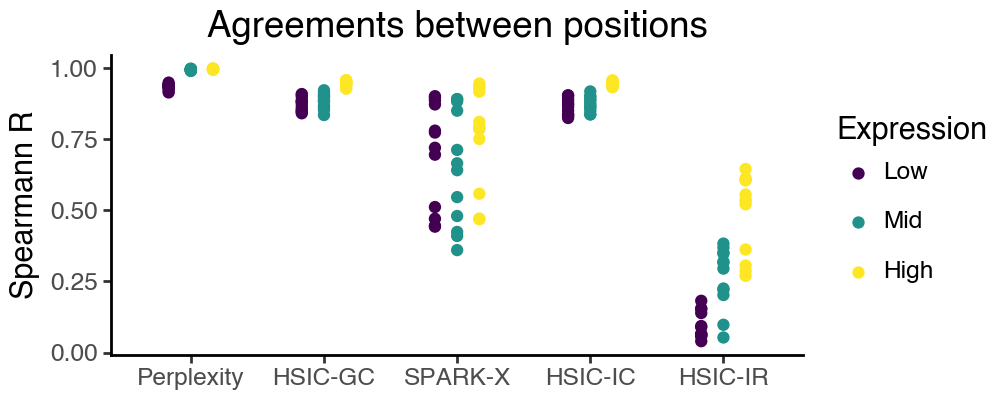

In [19]:
(
    ggplot(df_stat_pos, aes(x = 'stat', y = 'spearmannr', group = 'group', color = 'group')) + 
        geom_point(position = position_dodge(width = 0.5)) + 
        labs(x = '', y = 'Spearmann R', color = 'Expression', title = 'Agreements between positions') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Between individuals

In [20]:
df_stat_indiv = []
for id1, id2 in (
    list(itertools.product(('151507', '151508', '151509', '151510'), 
                           ('151669', '151670', '151671', '151672'))) +
    list(itertools.product(('151669', '151670', '151671', '151672'),
                           ('151673', '151674', '151675', '151676'))) +
    list(itertools.product(('151507', '151508', '151509', '151510'),
                           ('151673', '151674', '151675', '151676')))
    
):
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/sv_results/{id1}.sv_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/sv_results/{id2}.sv_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = 'gene')

    # separate genes into three groups by expression
    _g1 = _df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 1
    _g2 = (_df_pair[['count_avg_x', 'count_avg_y']].min(axis=1) > 0.5) & (~_g1)
    _g3 = (~_g1) & (~_g2)

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['perplexity', 'pvalue_hsic-ir', 'pvalue_hsic-gc', 'pvalue_hsic-ic', 'pvalue_spark-x']:
        for _g, _gname in zip(
            [_g1, _g2, _g3], ['High', 'Mid', 'Low']
        ):
            _df = _df_pair.loc[_g]
            _df_stat.append({
                'stat': _stat,
                'group': _gname,
                'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
                'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
            })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_indiv.append(_df_stat)

df_stat_indiv = pd.concat(df_stat_indiv)
df_stat_indiv['group'] = pd.Categorical(df_stat_indiv['group'], ordered=True, categories=['Low', 'Mid', 'High'])
df_stat_indiv['stat'] = pd.Categorical(df_stat_indiv['stat'], ordered=True, categories=[
    'perplexity', 'pvalue_hsic-gc', 'pvalue_spark-x', 'pvalue_hsic-ic', 'pvalue_hsic-ir']
).rename_categories({
    'perplexity': 'Perplexity', 
    'pvalue_hsic-gc': 'HSIC-GC', 
    'pvalue_spark-x': 'SPARK-X', 
    'pvalue_hsic-ic': 'HSIC-IC', 
    'pvalue_hsic-ir': 'HSIC-IR'
    
})

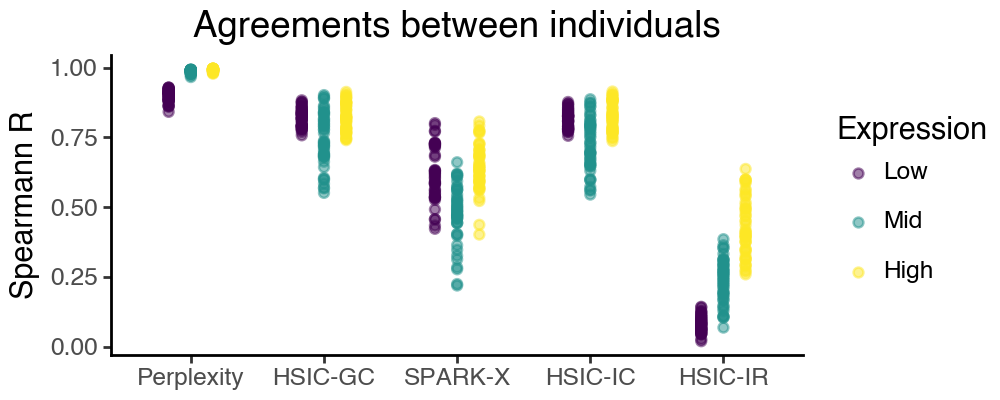

In [21]:
(
    ggplot(df_stat_indiv, aes(x = 'stat', y = 'spearmannr', group = 'group', color = 'group')) + 
        geom_point(position = position_dodge(width = 0.5), alpha = 0.5) + 
        labs(x = '', y = 'Spearmann R', color = 'Expression', title = 'Agreements between individuals') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Combined visualization

In [22]:
df_stat = pd.concat([
    df_stat_rep.assign(comp='replicates (n=6)'),
    df_stat_pos.assign(comp='positions (n=12)'),
    df_stat_indiv.assign(comp='individuals (n=48)')
])
df_stat['comp'] = pd.Categorical(df_stat['comp'], ordered=True, categories=[
    'replicates (n=6)', 'positions (n=12)', 'individuals (n=48)'
])

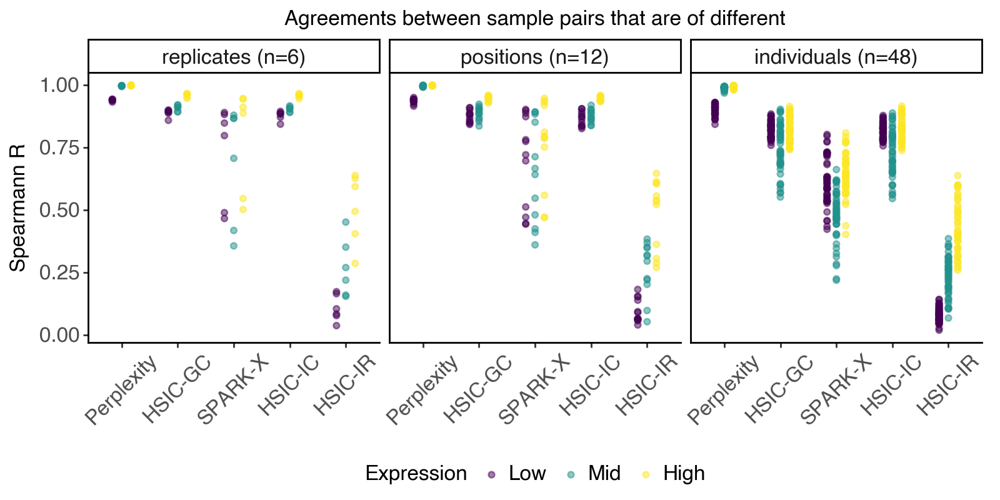

In [23]:
(
    ggplot(df_stat, aes(x = 'stat', y = 'spearmannr', group = 'group', color = 'group')) + 
        facet_wrap('~comp') + 
        geom_point(position = position_dodge(width = 0.5), alpha = 0.5) + 
        labs(x = '', y = 'Spearmann R', color = 'Expression', title = 'Agreements between sample pairs that are of different') + 
        theme_classic() + 
        theme(
            figure_size=[8,4],
            legend_position='bottom',
            text=element_text(size=12),
            axis_text_x=element_text(rotation=45)
        )
)

#### Save aggregated results

In [24]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

df_stat.to_csv(f"{res_dir}/figures/source_data/sv_agreements_stat_{date}.csv", index=False)

### Compare with mouse CBS SV results

#### Convert mouse SV genes to human homologs

In [15]:
_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/visium_mouse_cbs/"
_date = '1119'
mm_sv_cbs = pd.read_csv(f"{_dir}/sv_results/cbs_peak_sv_combined_{_date}.csv", index_col=0)

# define significant events
mm_sv_cbs['is_trend_svs'] = mm_sv_cbs['padj_hsic-ir'] < 0.01
mm_sv_cbs['is_trend_sve'] = mm_sv_cbs['padj_hsic-gc'] < 0.01
mm_sv_cbs['is_trend_expressed'] = mm_sv_cbs['count_avg'] > 0.5

In [16]:
# res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"

# # use Ensembl 113 for homolog conversion
# from gseapy import Biomart
# bm = Biomart()
# m2h = bm.query(
#     dataset='mmusculus_gene_ensembl',
#     attributes=['ensembl_gene_id','external_gene_name',
#                'hsapiens_homolog_ensembl_gene',
#                'hsapiens_homolog_associated_gene_name']
# )

# # save Ensembl 113 conversion
# m2h.loc[m2h['external_gene_name'].isin(mm_sv_cbs.index)].to_csv(
#     f"{res_dir}/events/m2h_sv_ensembl113.csv", index=False
# )

In [17]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
# use the combined Ensembl 98 + 113 to better handle renamed genes
m2h = pd.read_csv(f"{res_dir}/events/m2h_sv_combined.csv")

#### Compare homolog SVS genes

In [18]:
m2h_svs = m2h.loc[m2h['external_gene_name'].isin(mm_sv_cbs.index[mm_sv_cbs['is_trend_svs']])]
df_svs_gene['is_svs_mouse'] = df_svs_gene.index.isin(m2h_svs['hsapiens_homolog_associated_gene_name'])
df_svs_gene['is_svs_mouse'].value_counts()

is_svs_mouse
False    683
True     178
Name: count, dtype: int64

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


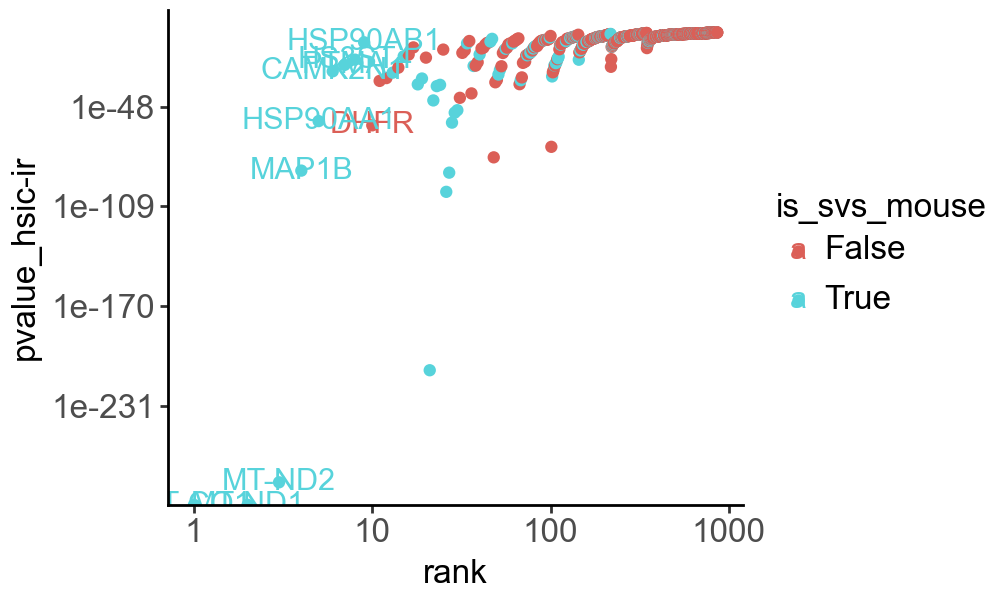

In [19]:
df = df_svs_gene.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_hsic-ir', color = 'is_svs_mouse')) +
        geom_point() + 
        geom_text(df.head(n = 10), aes(label = 'gene')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        theme_classic() + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

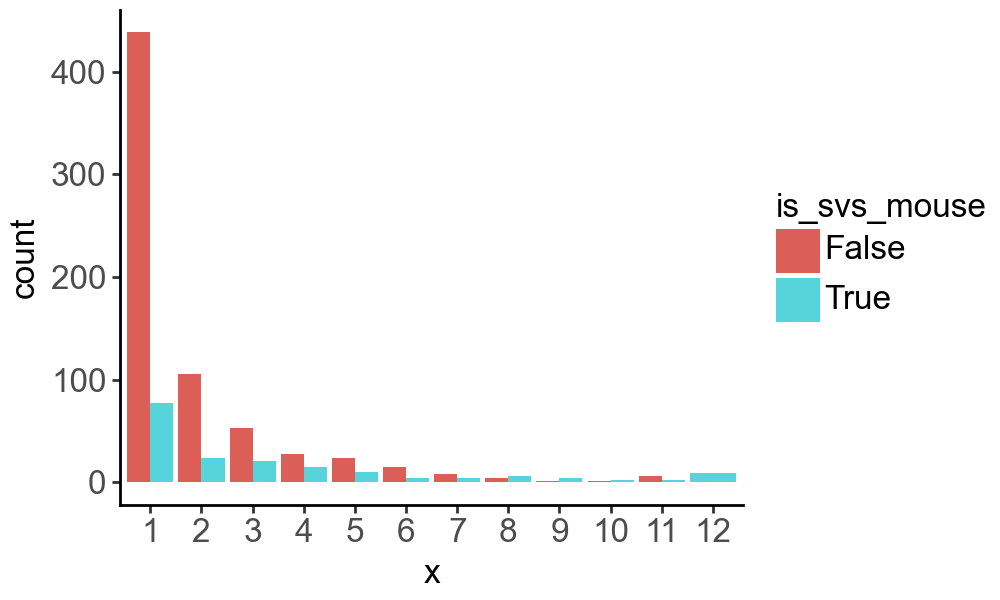

In [20]:
df = df_svs_gene
df['x'] = pd.Categorical(df['occurrence'])
# df['x'] = df['occurrence'].apply(lambda x: str(x) if x<=8 else '8+')
(
    ggplot(df, aes(x = 'x', group = 'is_svs_mouse', fill = 'is_svs_mouse')) +
        geom_bar(position = 'dodge') + 
        theme_classic() + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

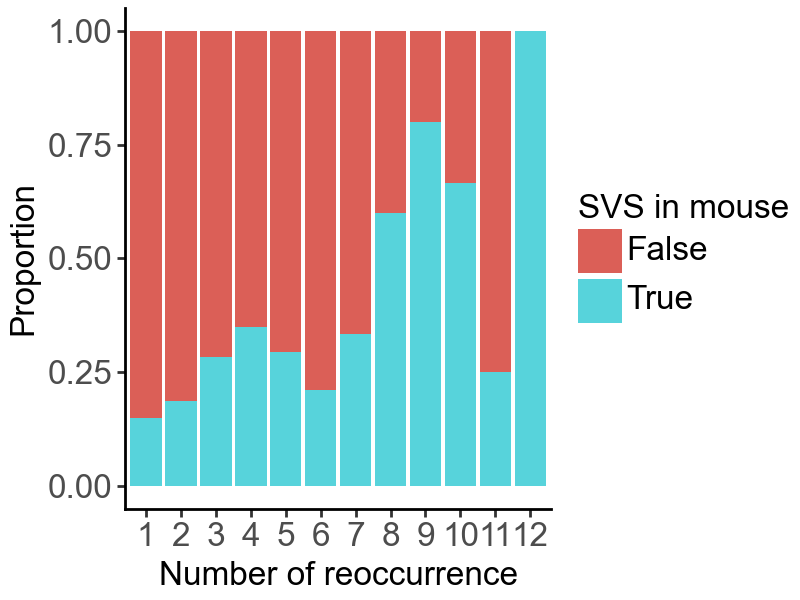

In [21]:
(
    ggplot(df, aes(x = 'x', group = 'is_svs_mouse', fill = 'is_svs_mouse')) +
        geom_bar(position = 'fill') + 
        theme_classic() + 
        labs(x = 'Number of reoccurrence', y = 'Proportion', fill = 'SVS in mouse') + 
        theme(
            figure_size=(4,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### Compare homolog SVE genes

In [22]:
m2h_sve = m2h.loc[m2h['external_gene_name'].isin(mm_sv_cbs.index[mm_sv_cbs['is_trend_sve']])]
df_sve_gene['is_sve_mouse'] = df_sve_gene.index.isin(m2h_sve['hsapiens_homolog_associated_gene_name'])
df_sve_gene['is_sve_mouse'].value_counts()

is_sve_mouse
False    4162
True     2213
Name: count, dtype: int64

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


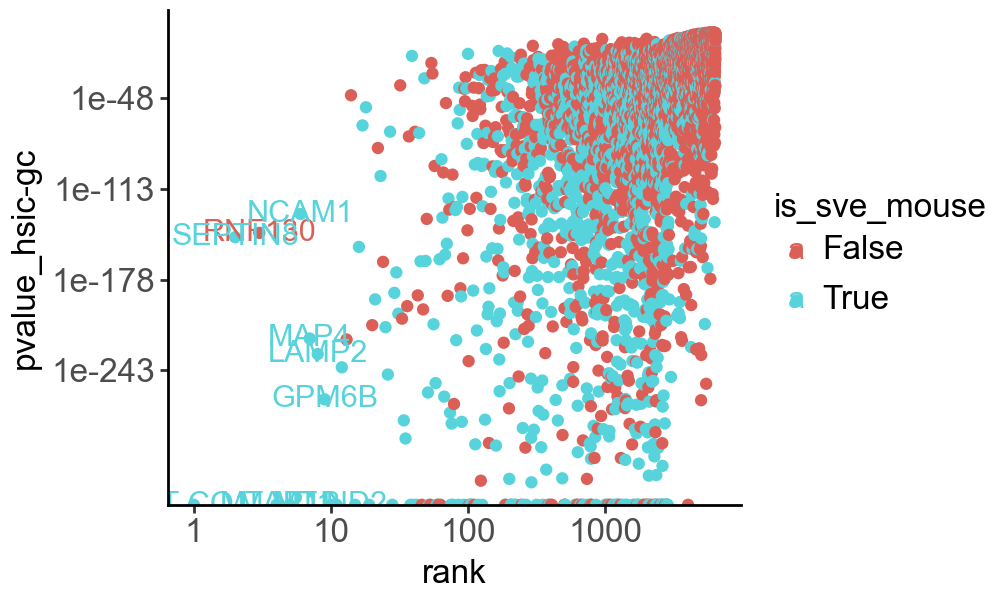

In [23]:
df = df_sve_gene.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_hsic-gc', color = 'is_sve_mouse')) +
        geom_point() + 
        geom_text(df.head(n = 10), aes(label = 'gene')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        theme_classic() + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

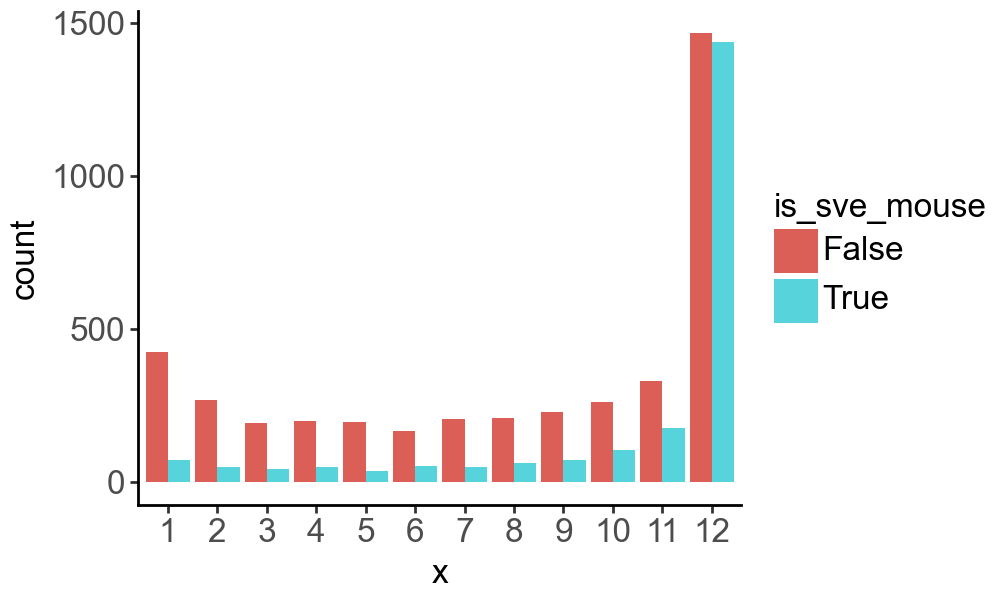

In [24]:
df = df_sve_gene
df['x'] = pd.Categorical(df['occurrence'])
# df['x'] = df['occurrence'].apply(lambda x: str(x) if x<=8 else '8+')
(
    ggplot(df, aes(x = 'x', group = 'is_sve_mouse', fill = 'is_sve_mouse')) +
        geom_bar(position = 'dodge') + 
        theme_classic() + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

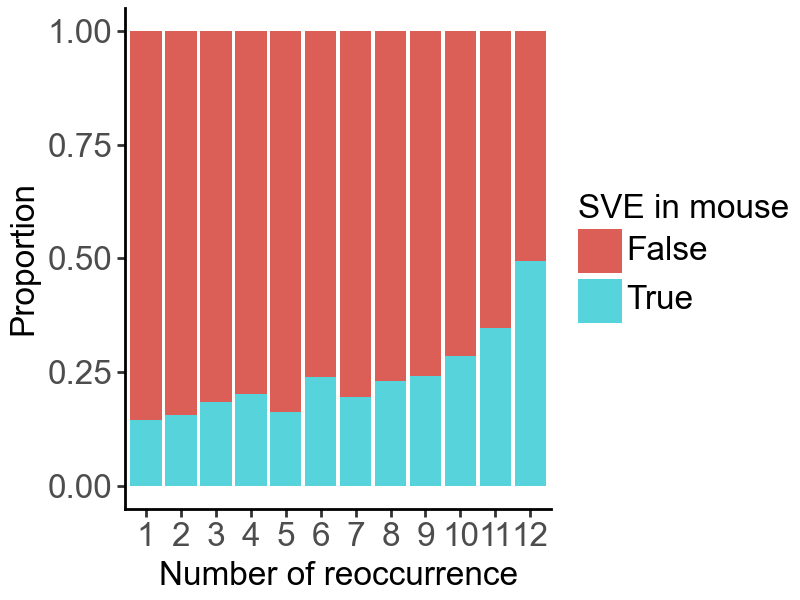

In [25]:
(
    ggplot(df, aes(x = 'x', group = 'is_sve_mouse', fill = 'is_sve_mouse')) +
        geom_bar(position = 'fill') + 
        labs(x = 'Number of reoccurrence', y = 'Proportion', fill = 'SVE in mouse') + 
        theme_classic() + 
        theme(
            figure_size=(4,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### Cumulative distribution of mouse SV genes

In [36]:
_n = [i+1 for i in range(12)]
_n_svs = []
_n_sve = []
for i in _n:
    _n_svs.append(
        m2h_svs['hsapiens_homolog_associated_gene_name'].isin(
            df_svs_gene.index[df_svs_gene['occurrence'] <= i]
        ).sum()
    )
    _n_sve.append(
        m2h_sve['hsapiens_homolog_associated_gene_name'].isin(
            df_sve_gene.index[df_sve_gene['occurrence'] <= i]
        ).sum()
    )

df_cum_mm_sv = pd.DataFrame({
    'occurrence': _n,
    'n_svs': _n_svs,
    'n_sve': _n_sve,
})
df_cum_mm_sv['p_svs'] = df_cum_mm_sv['n_svs'] / m2h_svs.shape[0]
df_cum_mm_sv['p_sve'] = df_cum_mm_sv['n_sve'] / m2h_sve.shape[0]

In [37]:
df_cum_mm_sv

,occurrence,n_svs,n_sve,p_svs,p_sve
0,1,78,72,0.095706,0.020894
1,2,102,123,0.125153,0.035694
2,3,123,167,0.150920,0.048462
3,4,138,218,0.169325,0.063262
4,5,148,256,0.181595,0.074289
5,6,152,309,0.186503,0.089669
6,7,156,359,0.191411,0.104179
7,8,162,422,0.198773,0.122461
8,9,166,496,0.203681,0.143935
9,10,168,601,0.206135,0.174405


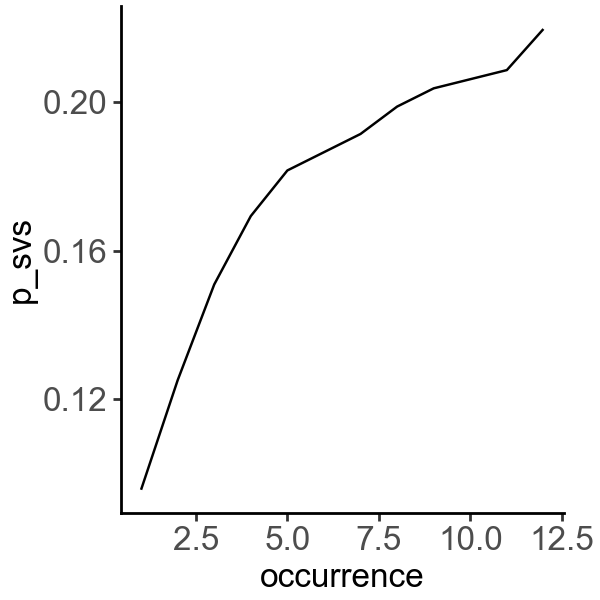

In [38]:
(
    ggplot(df_cum_mm_sv, aes(x = 'occurrence', y = 'p_svs')) + 
    geom_line() + 
    theme_classic() + 
    theme(
        figure_size=(3,3),
        text=element_text(size = 12, family = 'Arial')
    )
)

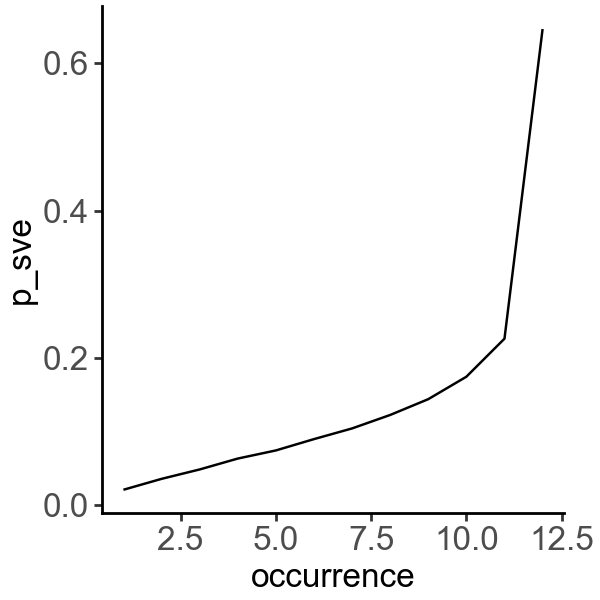

In [39]:
(
    ggplot(df_cum_mm_sv, aes(x = 'occurrence', y = 'p_sve')) + 
    geom_line() + 
    theme_classic() + 
    theme(
        figure_size=(3,3),
        text=element_text(size = 12, family = 'Arial')
    )
)

#### Dataset sparsity

In [40]:
df_seq_depth = pd.DataFrame({
    'sample': ['mouse'],
    'n_svs':  (mm_sv_cbs['padj_hsic-ir'] < 0.01).sum(),
    'median_count_avg': mm_sv_cbs['count_avg'].median(),
    'median_pct_spot_on': mm_sv_cbs['pct_spot_on'].median()
})

In [41]:
# process all 12 DLPFC samples
sample_list = [
    '151507', '151508', '151509', '151510', 
    '151669', '151670', '151671', '151672', 
    '151673', '151674', '151675', '151676'
]

for sample_id in sample_list:
    _df = pd.read_csv(f"{res_dir}/sv_results/{sample_id}.sv_combined_{date}.csv", index_col=None)
    df_seq_depth = pd.concat([
        df_seq_depth, pd.DataFrame({
            'sample': [sample_id],
            'n_svs':  (_df['padj_hsic-ir'] < 0.01).sum(),
            'median_count_avg': _df['count_avg'].median(),
            'median_pct_spot_on': _df['pct_spot_on'].median()
        })
    ])

df_seq_depth = df_seq_depth.reset_index(drop = True)

In [42]:
df_seq_depth

,sample,n_svs,median_count_avg,median_pct_spot_on
0,mouse,815,0.729710,0.466929
1,151507,61,0.133223,0.102461
2,151508,42,0.118841,0.091925
3,151509,90,0.136563,0.106703
4,151510,46,0.133362,0.104014
5,151669,28,0.164982,0.127834
6,151670,35,0.148513,0.115495
7,151671,48,0.170195,0.131509
8,151672,34,0.155666,0.123039
9,151673,244,0.201154,0.153614


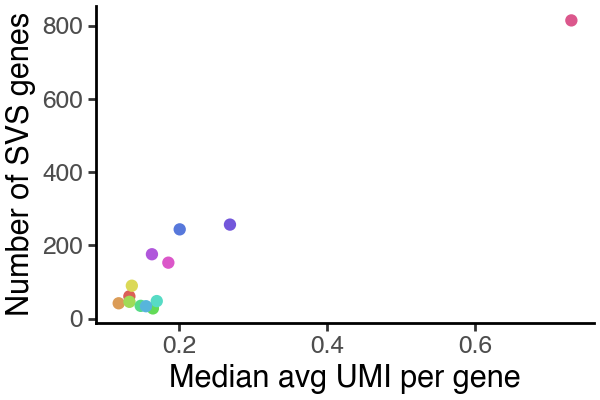

In [43]:
(
    ggplot(df_seq_depth, aes(x = 'median_count_avg', y = 'n_svs', color = 'sample')) + 
        geom_point() + 
        labs(x = 'Median avg UMI per gene', y = 'Number of SVS genes') + 
        theme_classic() + 
        theme(figure_size=(3,2), legend_position='none')
)

### Save SVS and SVE event in BED12

In [44]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/human_dlpfc/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

In [45]:
# load Sierra peak coordinates
peak_all = pd.read_table(f"{data_dir}/sierra_peaks_default/peak_default.merged.txt", index_col=False)

# Function to parse exon positions
def parse_exon_positions(row):
    peak_start = row["Fit.start"]
    peak_end = row["Fit.end"]
    
    if row["exon.intron"] == 'no-junctions':
        block_sizes = [peak_end - peak_start]
        block_starts = [0]
    else:
        # Extract the exon positions from the `exon.pos` column
        exon_positions = row["exon.pos"]
        
        # Clean and split the positions into tuples
        positions = exon_positions.split(')(')
        exons = [tuple(map(int, pos.replace('(', '').replace(')', '').split(","))) for pos in positions]

        # update the first and last exon
        exons[0] = (peak_start, exons[0][1])
        exons[-1] = (exons[-1][0], peak_end)
        
        # Calculate block sizes and block starts
        block_sizes = [end - start for start, end in exons]
        block_starts = [start - peak_start for start, _ in exons]
        
    return block_sizes, block_starts

#### All SVS genes (occurrence >= 2)

In [50]:
# define SVS and SVENS gene lists
svs_gene_list = df_svs_gene[df_svs_gene['occurrence'] >= 2].index.to_list()

# Save peaks of SVS genes
df = peak_all.loc[
    peak_all['Gene'].isin(svs_gene_list) & (peak_all['PeakClass'] == 'Merged')
]
df[["blockSizes", "blockStarts"]] = df.apply(
    lambda row: pd.Series(parse_exon_positions(row)), axis=1
)

# Create a BED12 DataFrame
bed12_df = pd.DataFrame({
    "chrom": df["Chr"],
    "chromStart": df["Fit.start"],
    "chromEnd": df["Fit.end"],
    "name": df["polyA_ID"],
    "score": 0,  # Default score
    "strand": df["Strand"].map({1: "+", -1: "-"}),  # Convert strand to "+" or "-"
    "thickStart": df["Fit.start"],  # Use full region for thick display
    "thickEnd": df["Fit.end"],
    "itemRgb": "0",  # Default black color
    "blockCount": df["blockSizes"].apply(len),
    "blockSizes": df["blockSizes"].apply(lambda x: ",".join(map(str, x))),
    "blockStarts": df["blockStarts"].apply(lambda x: ",".join(map(str, x))),
})

bed12_df = bed12_df.drop_duplicates(["chrom", "chromStart", "chromEnd", "strand", "name"])

# Save to BED12 format (tab-separated)
print(f"Saving {len(bed12_df)} peaks of {df['Gene'].nunique()} SVS genes.")
bed12_df.to_csv(f"{res_dir}/events/svs_all.exon.bed", sep="\t", index=False, header=False)

Saving 1319 peaks of 346 SVS genes.


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/60633391.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/60633391.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### All SVE but not SVS genes

In [51]:
# define SVS and SVENS gene lists
svs_gene_list = df_svs_gene[df_svs_gene['occurrence'] >= 2].index.to_list()
svens_gene_list = df_sve_gene.index[
    (df_sve_gene['occurrence'] >= 12) & (~df_sve_gene.index.isin(df_svs_gene.index))
].to_list()

# Save peaks of SVE but not SVS genes
df = peak_all.loc[
    peak_all['Gene'].isin(svens_gene_list) & (peak_all['PeakClass'] == 'Merged')
]
df[["blockSizes", "blockStarts"]] = df.apply(
    lambda row: pd.Series(parse_exon_positions(row)), axis=1
)

# Create a BED12 DataFrame
bed12_df = pd.DataFrame({
    "chrom": df["Chr"],
    "chromStart": df["Fit.start"],
    "chromEnd": df["Fit.end"],
    "name": df["polyA_ID"],
    "score": 0,  # Default score
    "strand": df["Strand"].map({1: "+", -1: "-"}),  # Convert strand to "+" or "-"
    "thickStart": df["Fit.start"],  # Use full region for thick display
    "thickEnd": df["Fit.end"],
    "itemRgb": "0",  # Default black color
    "blockCount": df["blockSizes"].apply(len),
    "blockSizes": df["blockSizes"].apply(lambda x: ",".join(map(str, x))),
    "blockStarts": df["blockStarts"].apply(lambda x: ",".join(map(str, x))),
})

bed12_df = bed12_df.drop_duplicates(["chrom", "chromStart", "chromEnd", "strand", "name"])

# Save to BED12 format (tab-separated)
print(f"Saving {len(bed12_df)} peaks of {df['Gene'].nunique()} SVENS genes.")
bed12_df.to_csv(f"{res_dir}/events/svens_all.exon.bed", sep="\t", index=False, header=False)

Saving 8044 peaks of 2259 SVENS genes.


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/2063439649.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/2063439649.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Mouse-shared SVS genes (occurrence >= 2)

In [52]:
# define SVS and SVENS gene lists
svs_gene_list = df_svs_gene[
    (df_svs_gene['occurrence'] >= 2) & (df_svs_gene['is_svs_mouse'])
].index.to_list()

# Save peaks of SVS genes
df = peak_all.loc[
    peak_all['Gene'].isin(svs_gene_list) & (peak_all['PeakClass'] == 'Merged')
]
df[["blockSizes", "blockStarts"]] = df.apply(
    lambda row: pd.Series(parse_exon_positions(row)), axis=1
)

# Create a BED12 DataFrame
bed12_df = pd.DataFrame({
    "chrom": df["Chr"],
    "chromStart": df["Fit.start"],
    "chromEnd": df["Fit.end"],
    "name": df["polyA_ID"],
    "score": 0,  # Default score
    "strand": df["Strand"].map({1: "+", -1: "-"}),  # Convert strand to "+" or "-"
    "thickStart": df["Fit.start"],  # Use full region for thick display
    "thickEnd": df["Fit.end"],
    "itemRgb": "0",  # Default black color
    "blockCount": df["blockSizes"].apply(len),
    "blockSizes": df["blockSizes"].apply(lambda x: ",".join(map(str, x))),
    "blockStarts": df["blockStarts"].apply(lambda x: ",".join(map(str, x))),
})

bed12_df = bed12_df.drop_duplicates(["chrom", "chromStart", "chromEnd", "strand", "name"])

# Save to BED12 format (tab-separated)
print(f"Saving {len(bed12_df)} peaks of {df['Gene'].nunique()} SVS genes shared with mouse.")
bed12_df.to_csv(f"{res_dir}/events/svs_shared.exon.bed", sep="\t", index=False, header=False)

Saving 401 peaks of 101 SVS genes shared with mouse.


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/1510840493.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/1510840493.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Mouse-shared SVE but not SVS genes

In [53]:
# define SVS and SVENS gene lists
svs_gene_list = df_svs_gene[df_svs_gene['occurrence'] >= 2].index.to_list()
svens_gene_list = df_sve_gene.index[
    (df_sve_gene['occurrence'] >= 12) & \
    (df_sve_gene['is_sve_mouse']) & \
    (~df_sve_gene.index.isin(df_svs_gene.index))
].to_list()

# Save peaks of SVE but not SVS genes
df = peak_all.loc[
    peak_all['Gene'].isin(svens_gene_list) & (peak_all['PeakClass'] == 'Merged')
]
df[["blockSizes", "blockStarts"]] = df.apply(
    lambda row: pd.Series(parse_exon_positions(row)), axis=1
)

# Create a BED12 DataFrame
bed12_df = pd.DataFrame({
    "chrom": df["Chr"],
    "chromStart": df["Fit.start"],
    "chromEnd": df["Fit.end"],
    "name": df["polyA_ID"],
    "score": 0,  # Default score
    "strand": df["Strand"].map({1: "+", -1: "-"}),  # Convert strand to "+" or "-"
    "thickStart": df["Fit.start"],  # Use full region for thick display
    "thickEnd": df["Fit.end"],
    "itemRgb": "0",  # Default black color
    "blockCount": df["blockSizes"].apply(len),
    "blockSizes": df["blockSizes"].apply(lambda x: ",".join(map(str, x))),
    "blockStarts": df["blockStarts"].apply(lambda x: ",".join(map(str, x))),
})

bed12_df = bed12_df.drop_duplicates(["chrom", "chromStart", "chromEnd", "strand", "name"])

# Save to BED12 format (tab-separated)
print(f"Saving {len(bed12_df)} peaks of {df['Gene'].nunique()} SVENS genes shared with mouse.")
bed12_df.to_csv(f"{res_dir}/events/svens_shared.exon.bed", sep="\t", index=False, header=False)

Saving 4022 peaks of 1081 SVENS genes shared with mouse.


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/1595296944.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/1595296944.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### All negative controls

In [54]:
# Save peaks of negative control genes
neg_gene_list = peak_all.loc[
    (~peak_all['Gene'].isin(df_svs_gene.index)) & \
    (~peak_all['Gene'].isin(df_sve_gene.index)) & \
    (peak_all['PeakClass'] == 'Merged'), 'Gene'
].unique()
df = peak_all.loc[
    peak_all['Gene'].isin(neg_gene_list) & (peak_all['PeakClass'] == 'Merged')
]
df[["blockSizes", "blockStarts"]] = df.apply(
    lambda row: pd.Series(parse_exon_positions(row)), axis=1
)

# Create a BED12 DataFrame
bed12_df = pd.DataFrame({
    "chrom": df["Chr"],
    "chromStart": df["Fit.start"],
    "chromEnd": df["Fit.end"],
    "name": df["polyA_ID"],
    "score": 0,  # Default score
    "strand": df["Strand"].map({1: "+", -1: "-"}),  # Convert strand to "+" or "-"
    "thickStart": df["Fit.start"],  # Use full region for thick display
    "thickEnd": df["Fit.end"],
    "itemRgb": "0",  # Default black color
    "blockCount": df["blockSizes"].apply(len),
    "blockSizes": df["blockSizes"].apply(lambda x: ",".join(map(str, x))),
    "blockStarts": df["blockStarts"].apply(lambda x: ",".join(map(str, x))),
})

bed12_df = bed12_df.drop_duplicates(["chrom", "chromStart", "chromEnd", "strand", "name"])

# Save to BED12 format (tab-separated)
print(f"Saving {len(bed12_df)} peaks of {df['Gene'].nunique()} negative control genes.")
bed12_df.to_csv(f"{res_dir}/events/neg_all.exon.bed", sep="\t", index=False, header=False)

Saving 12107 peaks of 10283 negative control genes.


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/5225872.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_91072/5225872.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


### Evolutionary conservation

#### GenTree estimated age

In [125]:
# downloaded from http://gentree.ioz.ac.cn/download.php
gid2age = pd.read_table(f"{data_dir}/external_data/hg38_ver95_age.tsv")
# gid2age = pd.read_table(f"{data_dir}/external_data/hg19_ver73_age.tsv")

In [109]:
from gseapy import Biomart
bm = Biomart()
# note the dataset and attribute names are different
hgid2name = bm.query(dataset='hsapiens_gene_ensembl',
               attributes=['ensembl_gene_id','external_gene_name'])

In [132]:
age_sve = pd.merge(
    df_sve_gene.join(hgid2name.set_index('external_gene_name')).reset_index(names='gene_symbol'), gid2age,
    how='left', left_on='ensembl_gene_id', right_on='gene'
)
age_svs = pd.merge(
    df_svs_gene.join(hgid2name.set_index('external_gene_name')).reset_index(names='gene_symbol'), gid2age,
    how='left', left_on='ensembl_gene_id', right_on='gene'
)

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 161 rows containing non-finite values.


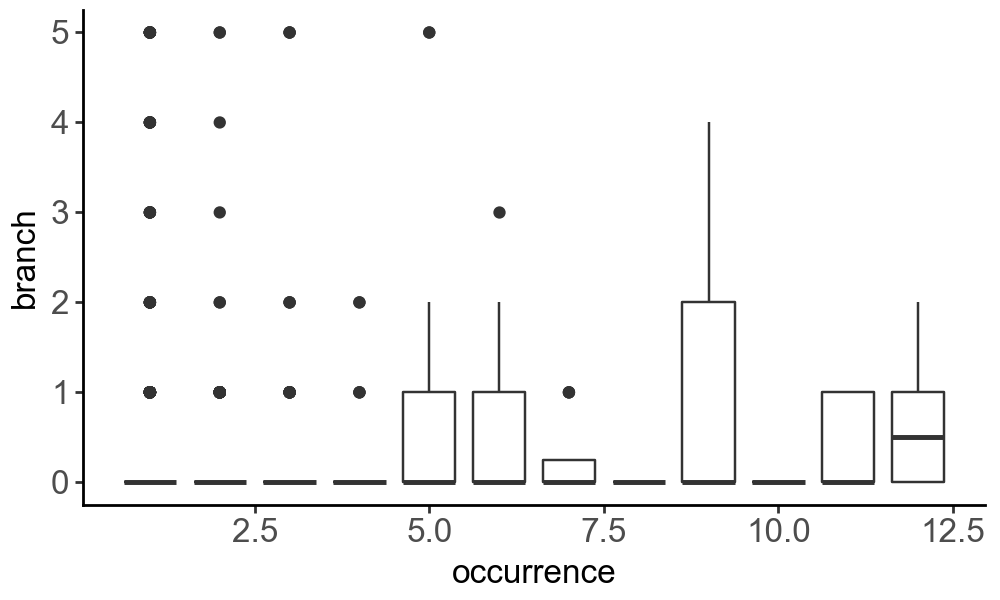

In [137]:
(
    ggplot(age_svs, aes(x = 'occurrence', y = 'branch', group = 'occurrence')) +
        geom_boxplot() + 
        theme_classic() + 
        lims(y = (0,5)) + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### GenOrigin estimated age

In [149]:
# downloaded from http://gentree.ioz.ac.cn/download.php
gid2age = pd.read_csv(f"{data_dir}/external_data/GenOrigin_Homo_Sapiens.csv")
gid2age.loc[gid2age['gene_age'] == '>4290', 'gene_age'] = '4290'
gid2age['gene_age'] = gid2age['gene_age'].astype(float)

In [151]:
age_sve = df_sve_gene.join(gid2age.set_index('external_gene_name'))
age_svs = df_svs_gene.join(gid2age.set_index('external_gene_name'))

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 59 rows containing non-finite values.


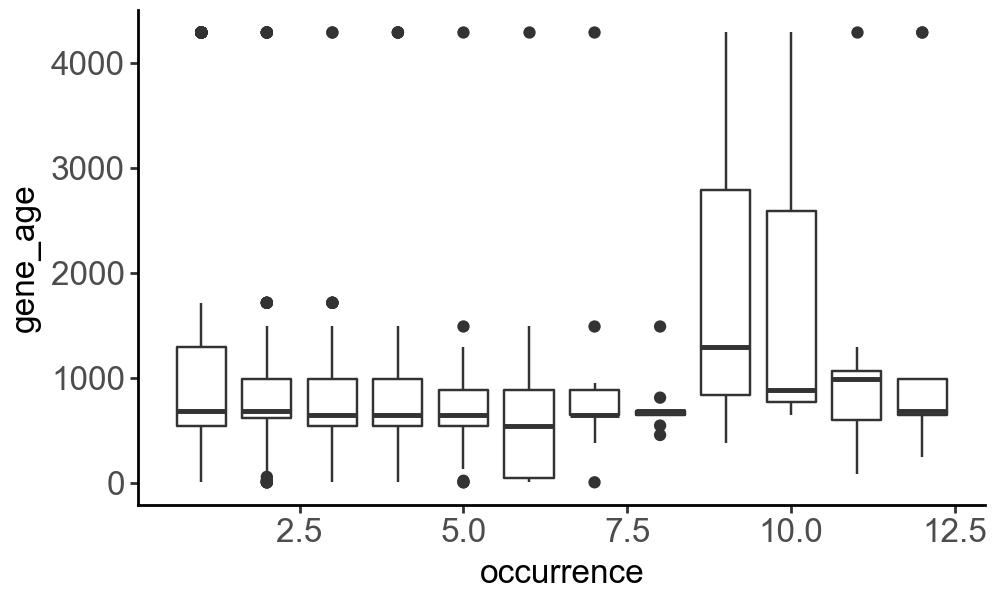

In [155]:
(
    ggplot(age_svs, aes(x = 'occurrence', y = 'gene_age', group = 'occurrence')) +
        geom_boxplot() + 
        theme_classic() + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### PhyloP scores

In [244]:
# peaks of SVS genes
svs_phylop = pd.read_table(
    f"{res_dir}/figures/source_data/svs_all.exon.phylop.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
svs_phylop['group'] = 'svs'
svs_phylop['gene'] = svs_phylop['id'].str.split(':').str[0]

# peaks of SVE but not SVS genes
svens_phylop = pd.read_table(
    f"{res_dir}/figures/source_data/svens_all.exon.phylop.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
svens_phylop['group'] = 'svens'
svens_phylop['gene'] = svens_phylop['id'].str.split(':').str[0]

# peaks of negative controls
neg_phylop = pd.read_table(
    f"{res_dir}/figures/source_data/neg_all.exon.phylop.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
neg_phylop['group'] = 'neg'
neg_phylop['gene'] = neg_phylop['id'].str.split(':').str[0]

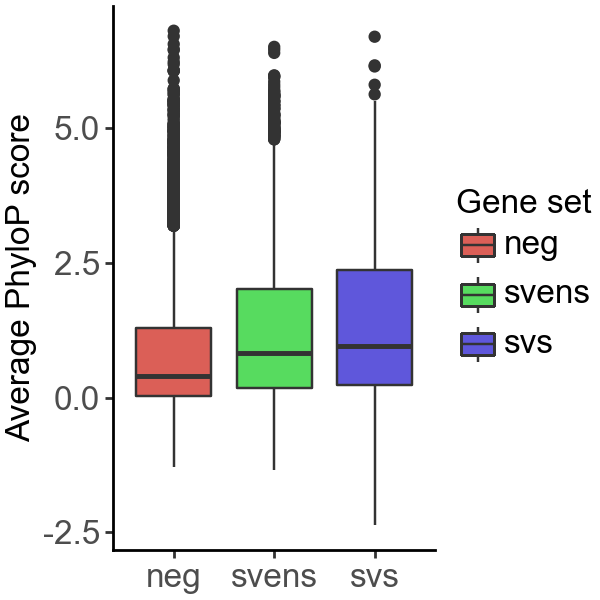

In [252]:
df = pd.concat([svs_phylop, svens_phylop, neg_phylop])
(
    ggplot(df, aes(x = 'group', y = 'mean', group = 'group', fill = 'group')) +
        geom_boxplot() + 
        theme_classic() + 
        labs(x = '', y = 'Average PhyloP score', fill = 'Gene set') + 
        # lims(y = (0,5)) + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 164 rows containing non-finite values.


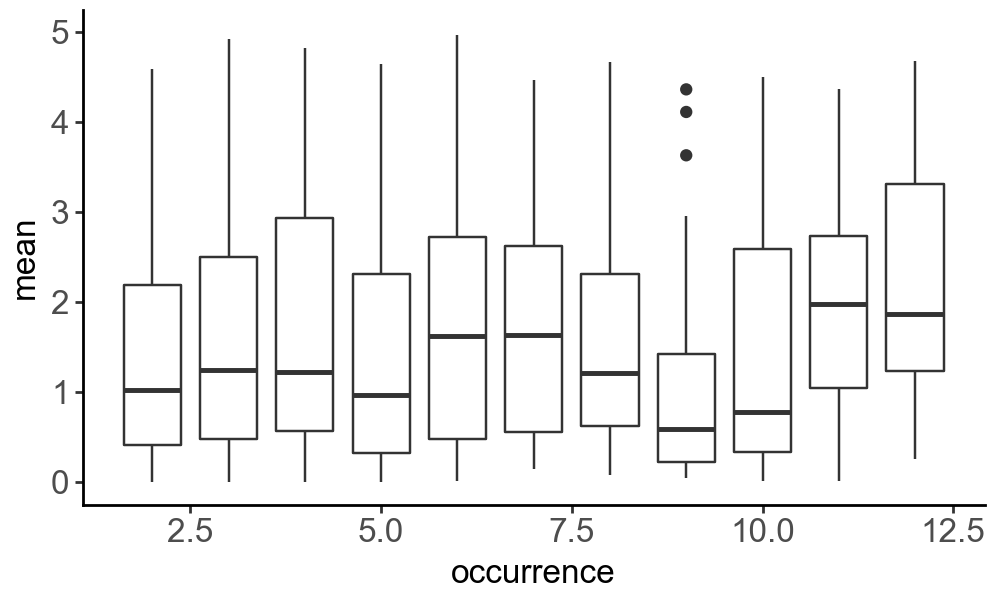

In [227]:
df = svs_phylop.set_index('gene').join(df_svs_gene)
(
    ggplot(df, aes(x = 'occurrence', y = 'mean', group = 'occurrence')) +
        geom_boxplot() + 
        theme_classic() + 
        lims(y = (0,5)) + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### PhastCons scores

In [260]:
# peaks of SVS genes
svs_phastcons = pd.read_table(
    f"{res_dir}/figures/source_data/svs_all.exon.phastcons.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
svs_phastcons['group'] = 'svs'
svs_phastcons['gene'] = svs_phastcons['id'].str.split(':').str[0]

# peaks of SVE but not SVS genes
svens_phastcons = pd.read_table(
    f"{res_dir}/figures/source_data/svens_all.exon.phastcons.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
svens_phastcons['group'] = 'svens'
svens_phastcons['gene'] = svens_phastcons['id'].str.split(':').str[0]

# peaks of negative controls
neg_phastcons = pd.read_table(
    f"{res_dir}/figures/source_data/neg_all.exon.phastcons.tab", 
    names = ['id', 'size', 'covered', 'sum', 'mean0', 'mean'],
    index_col=False
)
neg_phastcons['group'] = 'neg'
neg_phastcons['gene'] = neg_phastcons['id'].str.split(':').str[0]

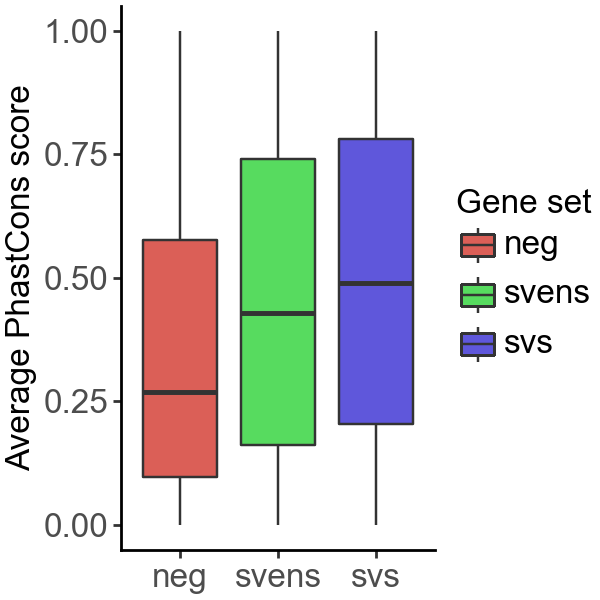

In [261]:
df = pd.concat([svs_phastcons, svens_phastcons, neg_phastcons])
(
    ggplot(df, aes(x = 'group', y = 'mean', group = 'group', fill = 'group')) +
        geom_boxplot() + 
        theme_classic() + 
        labs(x = '', y = 'Average PhastCons score', fill = 'Gene set') + 
        # lims(y = (0,5)) + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

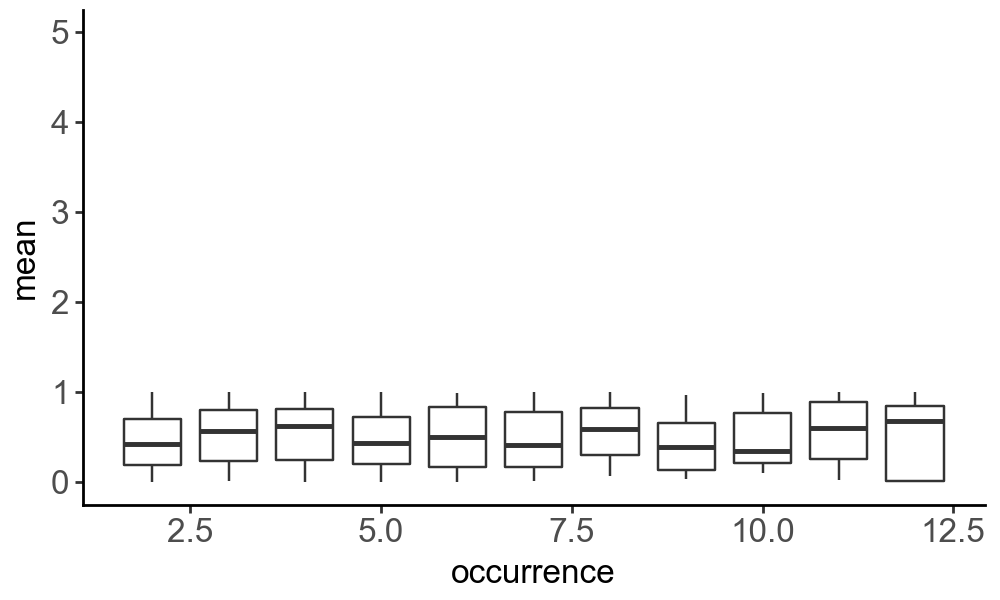

In [262]:
df = svs_phastcons.set_index('gene').join(df_svs_gene)
(
    ggplot(df, aes(x = 'occurrence', y = 'mean', group = 'occurrence')) +
        geom_boxplot() + 
        theme_classic() + 
        lims(y = (0,5)) + 
        theme(
            figure_size=(5,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

### Functional enrichment analysis

In [55]:
def get_enrich_res(
    svs_gene_list,
    svens_gene_list,
    sources_list = ['GO:BP'],
    topk = 20,
    return_enr_res = False
):
    # run enrichment analysis
    enr_svs = sc.queries.enrich(
        svs_gene_list, org="hsapiens", 
        gprofiler_kwargs = {'all_results': True, 'sources': sources_list},
    )
    enr_svens = sc.queries.enrich(
        svens_gene_list, org="hsapiens", 
        gprofiler_kwargs = {'all_results': True, 'sources': sources_list},
    )

    # extract significant positive and negative functional terms
    _top_term_svs = enr_svs.loc[enr_svs['significant'], 'native'].to_list()
    _top_go_svens = enr_svens.loc[enr_svens['significant'], 'native'].to_list()
    
    # combine results
    df_term = pd.concat([
        enr_svs.loc[
            enr_svs['native'].isin(_top_term_svs + _top_go_svens),
            # ['source', 'native', 'name', 'description', 'term_size']
        ].assign(geneset = 'SVS'),
        enr_svens.loc[
            enr_svens['native'].isin(_top_term_svs + _top_go_svens),
            # ['source', 'native', 'name', 'description', 'term_size']
        ].assign(geneset = 'SVE'),
    ])
    
    # calculated precision differences
    unstacked = df_term.groupby(['native', 'geneset'])['precision'].mean().unstack()
    unstacked['precision_diff'] = unstacked['SVS'] - unstacked['SVE']
    df_term = df_term.merge(unstacked[['precision_diff']], on='native', how='left')
    
    # sort terms by the precision difference and keep top terms
    _order1 = df_term.sort_values('precision_diff', ascending=True).head(topk)['name'].unique().tolist()
    _order2 = df_term.sort_values('precision_diff', ascending=False).head(topk)['name'].unique().tolist()
    df_term = df_term.loc[df_term['name'].isin(_order1 + _order2)]

    # sort resulting dataframe by precision difference
    df_term.sort_values(by = 'precision_diff', inplace = True)
    df_term['name_cat'] = pd.Categorical(df_term['name'], ordered=True, categories=df_term['name'].unique())

    if not return_enr_res:
        return df_term
    else:
        return df_term, enr_svs, enr_svens

#### Define gene sets

In [56]:
svs_gene_list = df_svs_gene[df_svs_gene['occurrence'] >= 2].index.to_list()
svens_gene_list = df_sve_gene.index[
    (df_sve_gene['occurrence'] >= 12) & (~df_sve_gene.index.isin(df_svs_gene.index))
].to_list()

svs_shared_gene_list = df_svs_gene[
    (df_svs_gene['occurrence'] >= 2) & (df_svs_gene['is_svs_mouse'])
].index.to_list()

svens_shared_gene_list = df_sve_gene.index[
    (df_sve_gene['occurrence'] >= 12) & \
    (df_sve_gene['is_sve_mouse']) & \
    (~df_sve_gene.index.isin(df_svs_gene.index))
].to_list()

print(len(svs_gene_list), len(svens_gene_list), 
      len(svs_shared_gene_list), len(svens_shared_gene_list))

346 2259 101 1081


#### Gene Ontology Enrichment

In [57]:
df_go = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['GO:BP'], topk=20)
df_go['name_cat'] = pd.Categorical(
    df_go['name_cat'].str.capitalize(), 
    ordered = True, categories=df_go['name_cat'].str.capitalize().unique()
)

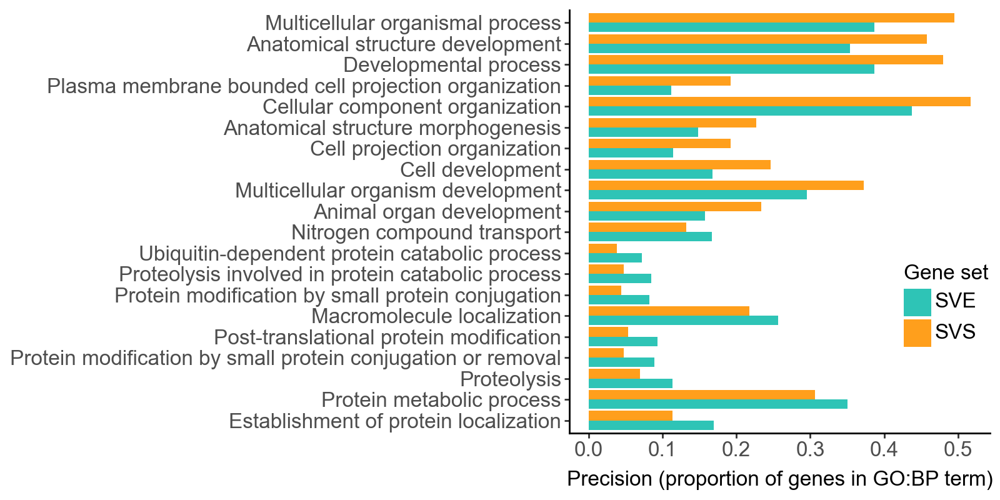

In [58]:
(
    ggplot(df_go, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in GO:BP term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.25)
        )
)

In [59]:
df_go_shared = get_enrich_res(svs_shared_gene_list, svens_shared_gene_list, sources_list=['GO:BP'], topk=20)
df_go_shared['name_cat'] = pd.Categorical(
    df_go_shared['name_cat'].str.capitalize(), 
    ordered = True, categories=df_go_shared['name_cat'].str.capitalize().unique()
)

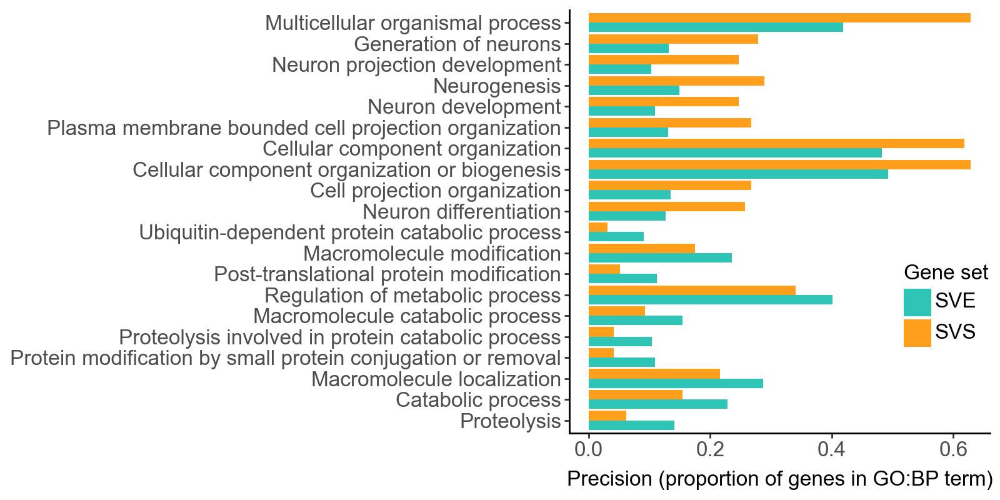

In [60]:
(
    ggplot(df_go_shared, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in GO:BP term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.25)
        )
)

#### KEGG Enrichment

In [61]:
df_kegg = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['KEGG'], topk=20)
df_kegg_shared = get_enrich_res(svs_shared_gene_list, svens_shared_gene_list, sources_list=['KEGG'], topk=20)

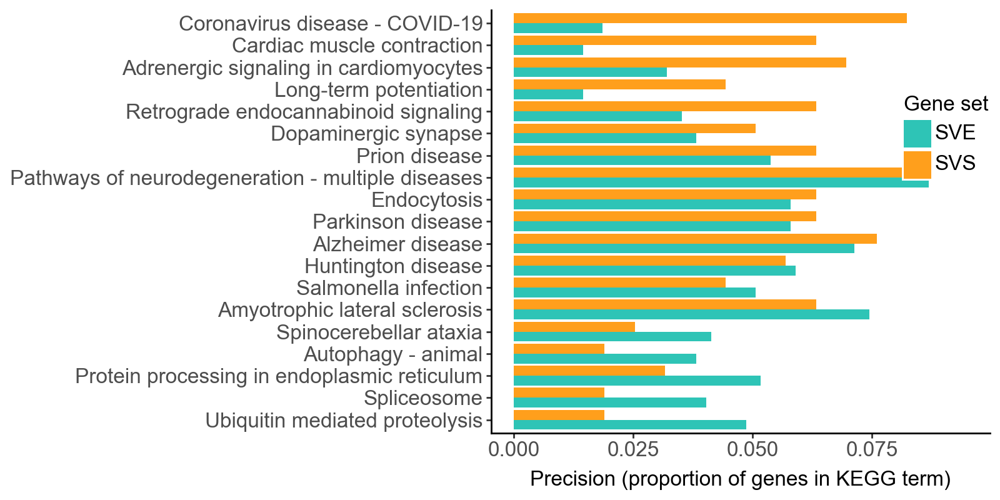

In [62]:
(
    ggplot(df_kegg, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in KEGG term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.75)
        )
)

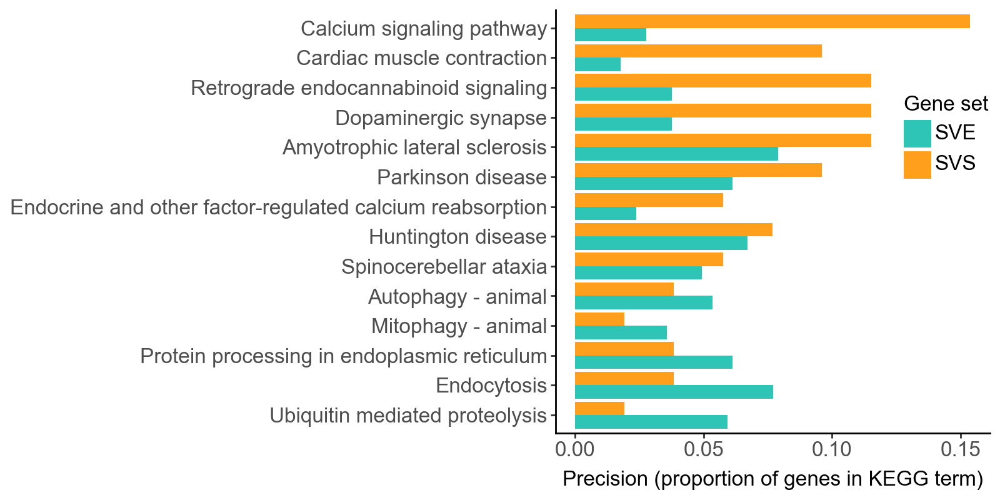

In [63]:
(
    ggplot(df_kegg_shared, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in KEGG term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.75)
        )
)

#### Reactome Enrichment

In [64]:
df_reac = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['REAC'], topk=20)
df_reac_shared = get_enrich_res(svs_shared_gene_list, svens_shared_gene_list, sources_list=['REAC'], topk=20)

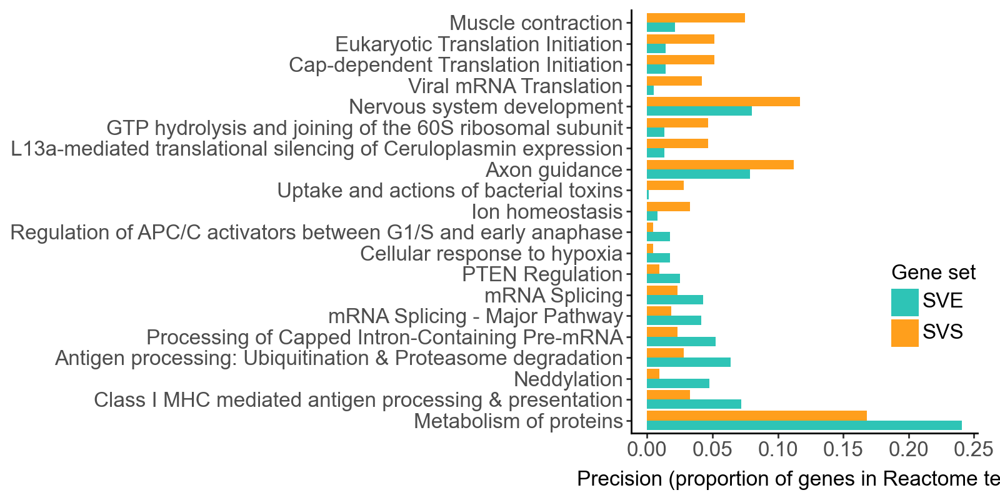

In [65]:
(
    ggplot(df_reac, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in Reactome term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.25)
        )
)

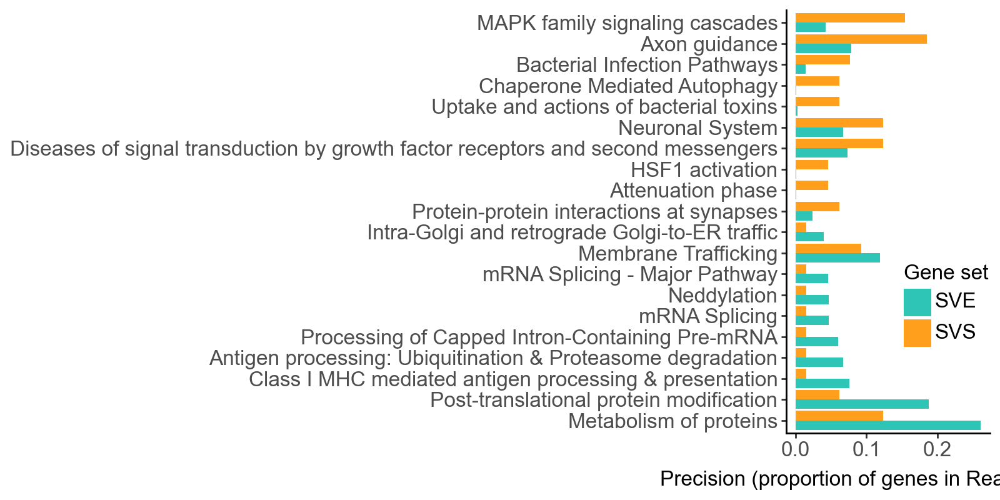

In [66]:
(
    ggplot(df_reac_shared, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in Reactome term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.25)
        )
)

#### Save enrichment results

In [72]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"

# functional enrichment results
df_go.to_csv(f"{res_dir}/figures/source_data/go_all_top20.csv", index = False)
df_kegg.to_csv(f"{res_dir}/figures/source_data/kegg_all_top20.csv", index = False)
df_reac.to_csv(f"{res_dir}/figures/source_data/reac_all_top20.csv", index = False)

# sv genes with mouse homologs
df_go_shared.to_csv(f"{res_dir}/figures/source_data/go_shared_top20.csv", index = False)
df_kegg_shared.to_csv(f"{res_dir}/figures/source_data/kegg_shared_top20.csv", index = False)
df_reac_shared.to_csv(f"{res_dir}/figures/source_data/reac_shared_top20.csv", index = False)

## Prepare anndata with SV results

### Load anndata for one sample

In [7]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/human_dlpfc/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

sample_id = '151673'

In [8]:
from smoother import SpatialWeightMatrix
from isosde.utils import extract_counts_n_ratios

# helper function to calculate smoothed counts and ratios
def calc_smoothed_counts_n_ratios(adata, p = 0.2):
    # compute spatial knn graph
    coords = adata.obs.loc[:, ['array_row', 'array_col']]
    swm = SpatialWeightMatrix()
    swm.calc_weights_knn(coords, k = 6)

    # compute locally smoothed isoform counts
    scaling = swm.swm.to_dense() * p + torch.eye(adata.shape[0]) * (1 - p) # (n_spots, n_spots)
    adata.layers['counts_smoothed'] = scaling.numpy() @ adata.layers['counts'] # (n_spots, n_total_isos)
    
    # calculate usage ratio from counts
    _, _, _, _ratio_merged = extract_counts_n_ratios(adata, layer = 'counts_smoothed', group_iso_by = 'gene_symbol')
    adata.layers['ratios_smoothed'] = _ratio_merged # (n_spots, n_total_isos)

    return adata

#### Load TREND and Visium data

In [9]:
# load visium count data
adata_visium = sc.read_h5ad(f"{res_dir}/anndata/visium/{sample_id}.visium_{date}.h5ad")

In [10]:
# load the TREND count data
adata_peak = sc.read_h5ad(f"{res_dir}/anndata/sierra/{sample_id}.peak_filtered_{date}.h5ad")

# compute smoothed read counts
adata_peak = calc_smoothed_counts_n_ratios(adata_peak, p = 0.2)

# focus on expressed SVS genes only
# df = df_sv_pval[df_sv_pval['sample_id'] == sample_id]
_df = pd.read_csv(f"{res_dir}/sv_results/{sample_id}.sv_combined_{date}.csv", index_col=None)
_df['sample_id'] = sample_id

# set significance threshold
_df['is_trend_svs'] = _df['padj_hsic-ir'] < 0.05
_df['is_trend_sve'] = _df['padj_hsic-gc'] < 0.05
_df['is_trend_expressed'] = _df['count_avg'] > 0.5

_iso_ind = adata_peak.var['gene_symbol'].isin(
    _df.loc[(_df['is_trend_svs'] & _df['is_trend_expressed']), 'gene']
)
adata_peak_sv = adata_peak[:, _iso_ind].copy()

Number of spots: 3639. Average number of neighbors per spot:  6.00.


#### Load GLMM fitting results

In [11]:
# load fitted GLMM model and extract inferred isoform ratio
glmm = torch.load(f"{res_dir}/model/{sample_id}.glmm_{date}.pkl")
glmm_model_list = glmm.get_fitted_models()

In [12]:
# extract estimated ratio
iso_ind_list = []

for i, (_gene, _group) in enumerate(adata_peak_sv.var.reset_index().groupby('gene_symbol')):
    assert glmm.gene_names[i] == _gene
    # extract isoform index per gene
    iso_ind_list.append(_group.index.tolist())

ratio_fitted_list = [_m.get_isoform_ratio().squeeze() for _m in glmm_model_list]

# reshape and store the fitted ratio in anndata
ratio_fitted_merged = torch.concat(ratio_fitted_list, axis = 1).numpy()
ratio_fitted_merged = ratio_fitted_merged[:, np.argsort(np.concatenate(iso_ind_list))]

adata_peak_sv.layers['ratios_glmm'] = ratio_fitted_merged.copy()

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_70047/692741701.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


### Visualize example RBP SVS pairs

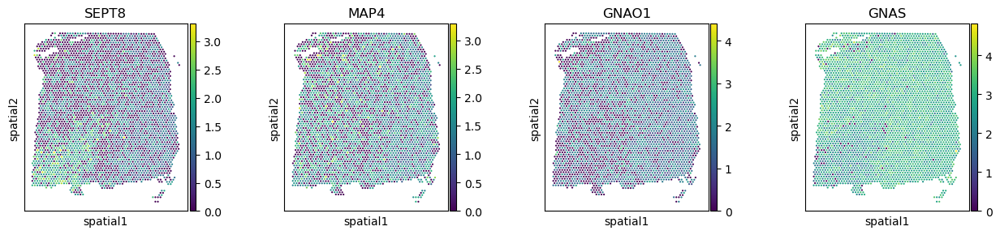

In [32]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = ['SEPT8', 'MAP4', 'GNAO1', 'GNAS'], img_key = 'lowres', alpha_img=0, layer = 'log1p')

#### SEPTIN8

In [275]:
_df = adata_peak.var.loc[adata_peak.var['gene_symbol'] == 'SEPTIN8'].sort_values('position')
_df

,gene_symbol,chr,position,strand,gene_id,Gene,Chr,Strand,Fit.start,Fit.end,PeakClass,OriginalPeak,DataOrigin,exon.intron,exon.pos,n_cells,peak_id
SEPTIN8:chr5:132750819-132751154:-1,SEPTIN8,chr5,132750819-132751154,-1,SEPTIN8,SEPTIN8,chr5,-1,132750819,132751154,Merged,SEPTIN8:chr5:132750819-132751131:-1,151507,no-junctions,NaN,1616,SEPTIN8:chr5:132750819-132751154:-1
SEPTIN8:chr5:132751759-132752179:-1,SEPTIN8,chr5,132751759-132752179,-1,SEPTIN8,SEPTIN8,chr5,-1,132751759,132752179,Merged,SEPTIN8:chr5:132751759-132752167:-1,151507,no-junctions,NaN,70,SEPTIN8:chr5:132751759-132752179:-1
SEPTIN8:chr5:132755914-132756424:-1,SEPTIN8,chr5,132755914-132756424,-1,SEPTIN8,SEPTIN8,chr5,-1,132755914,132756424,Merged,SEPTIN8:chr5:132755981-132756401:-1,151508,no-junctions,NaN,190,SEPTIN8:chr5:132755914-132756424:-1
SEPTIN8:chr5:132758089-132758546:-1,SEPTIN8,chr5,132758089-132758546,-1,SEPTIN8,SEPTIN8,chr5,-1,132758089,132758546,Merged,SEPTIN8:chr5:132758116-132758536:-1,151507,no-junctions,NaN,967,SEPTIN8:chr5:132758089-132758546:-1


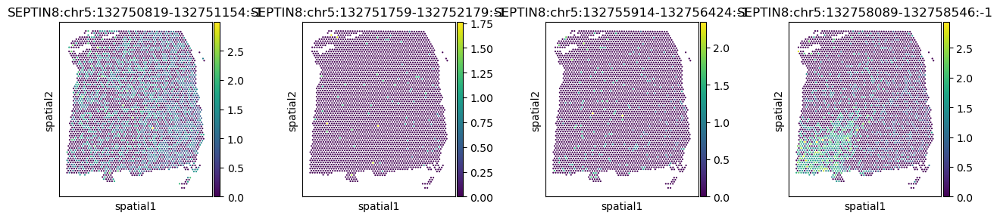

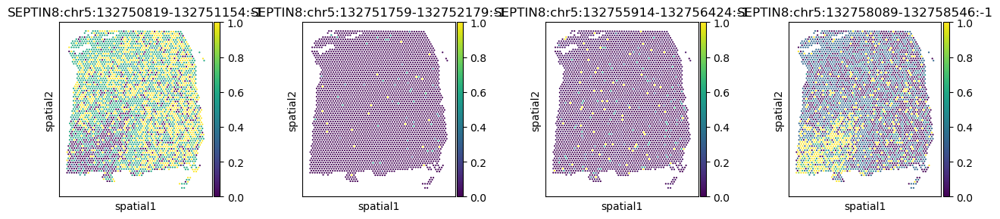

In [276]:
_iso_to_plot = _df.index
_name_to_plot = _df['peak_id']
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
              img_key = 'lowres', alpha_img=0, layer = 'log1p', ncols = len(_iso_to_plot))
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0, layer = 'ratios_obs', ncols = len(_iso_to_plot))

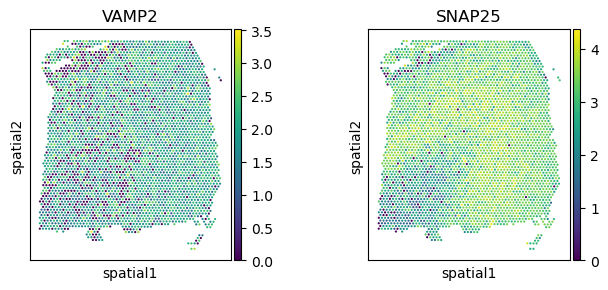

In [280]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = ['VAMP2', 'SNAP25'], img_key = 'lowres', alpha_img=0, layer = 'log1p')

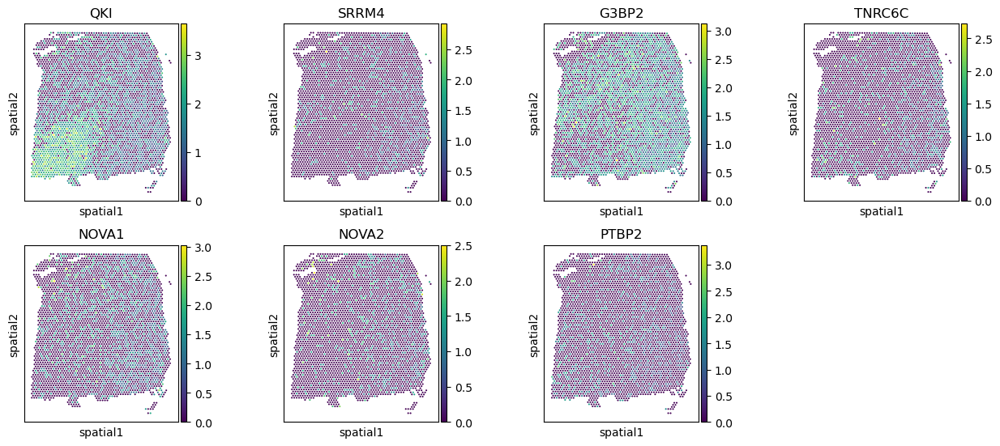

In [8]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = ['QKI', 'SRRM4', 'G3BP2', 'TNRC6C', 
                                         'NOVA1', 'NOVA2', 'PTBP2'], img_key = 'lowres', alpha_img=0, layer = 'log1p')

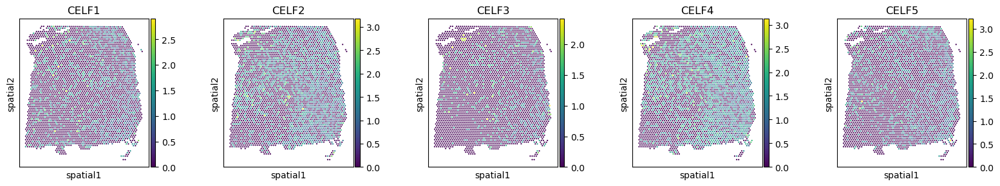

In [282]:
_rbp_to_plot = adata_visium.var_names[adata_visium.var_names.str.startswith('CELF')].sort_values()
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = _rbp_to_plot, ncols=len(_rbp_to_plot),
              img_key = 'lowres', alpha_img=0, layer = 'log1p')

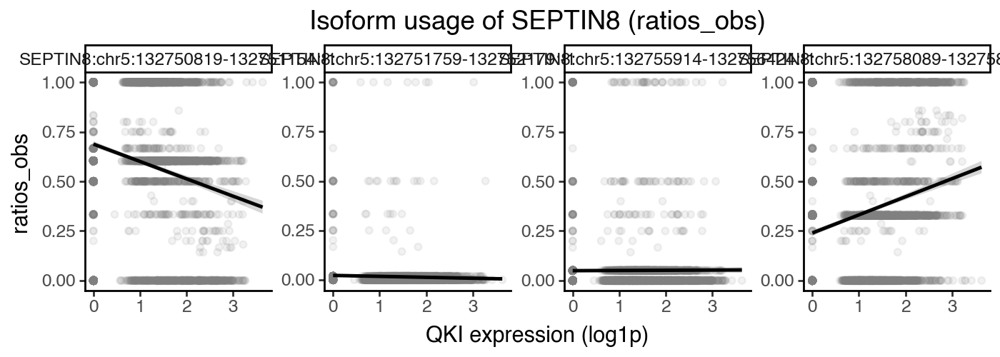

In [283]:
_svs_gene = 'SEPTIN8'
_rbp_gene = 'QKI'
_svs_layer = 'ratios_obs'
_visium_layer = 'log1p'

# _iso_to_plot = ['RPS']

# Extract RBP expression from 'adata_visium_rbp'
_df = pd.DataFrame({
    _rbp_gene: adata_visium[:, _rbp_gene].layers[_visium_layer].toarray().squeeze(),
})
 
# Extract isoform usage from 'adata_ont_sv'
_iso_to_plot = adata_peak.var.index[adata_peak.var['gene_symbol'] == _svs_gene]
_name_to_plot = adata_peak.var.loc[adata_peak.var['gene_symbol'] == _svs_gene].index

for _ind, _name in zip(_iso_to_plot, _name_to_plot):
    if _svs_layer in ['log1p', 'counts']:
        _df[_name] = adata_peak[:, _ind].layers[_svs_layer].toarray().squeeze()
    else:
        _df[_name] = adata_peak[:, _ind].layers[_svs_layer].squeeze()
 
# Melt the dataframe for ggplot visualization
# Before: columns ['Rbfox3', 'Myl-201', 'Myl-206', 'Myl-211', 'Myl-212']
# After: columns ['Rbfox3', 'isoform', 'ratios_smoothed']
df_ratio2rbp = _df.melt(id_vars=[_rbp_gene], var_name='isoform', value_name=_svs_layer)

(
    ggplot(df_ratio2rbp, aes(x = _rbp_gene, y = _svs_layer)) +
        facet_wrap('~ isoform', scales='free_y', ncol = len(_iso_to_plot)) +
        geom_point(alpha = 0.1, color = 'gray') +
        stat_smooth(method = 'lm') + 
        labs(x = f'{_rbp_gene} expression ({_visium_layer})', title = f'Isoform usage of {_svs_gene} ({_svs_layer})') +
        theme_classic() + 
        theme(figure_size=[7,2.5])
)

#### MAP4

In [284]:
_df = adata_peak.var.loc[adata_peak.var['gene_symbol'] == 'MAP4'].sort_values('position')
_df

,gene_symbol,chr,position,strand,gene_id,Gene,Chr,Strand,Fit.start,Fit.end,PeakClass,OriginalPeak,DataOrigin,exon.intron,exon.pos,n_cells,peak_id
MAP4:chr3:47850690-47850995:-1,MAP4,chr3,47850690-47850995,-1,MAP4,MAP4,chr3,-1,47850690,47850995,Merged,MAP4:chr3:47850690-47850984:-1,151507,no-junctions,NaN,1531,MAP4:chr3:47850690-47850995:-1
MAP4:chr3:47851479-47851989:-1,MAP4,chr3,47851479-47851989,-1,MAP4,MAP4,chr3,-1,47851479,47851989,Merged,MAP4:chr3:47851535-47851961:-1,151507,no-junctions,NaN,343,MAP4:chr3:47851479-47851989:-1
MAP4:chr3:47973010-47973500:-1,MAP4,chr3,47973010-47973500,-1,MAP4,MAP4,chr3,-1,47973010,47973500,Merged,MAP4:chr3:47973046-47973484:-1,151507,no-junctions,NaN,1873,MAP4:chr3:47973010-47973500:-1


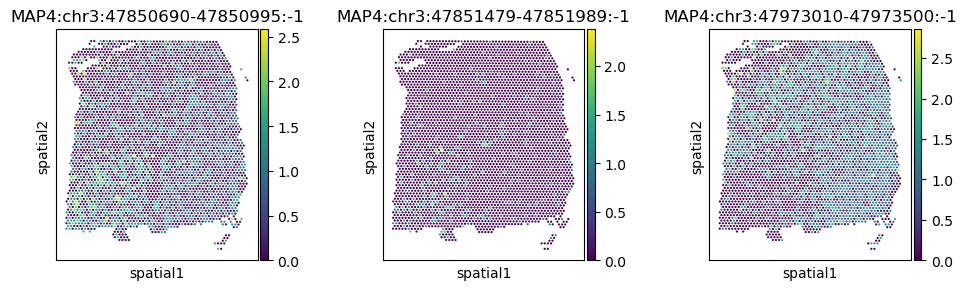

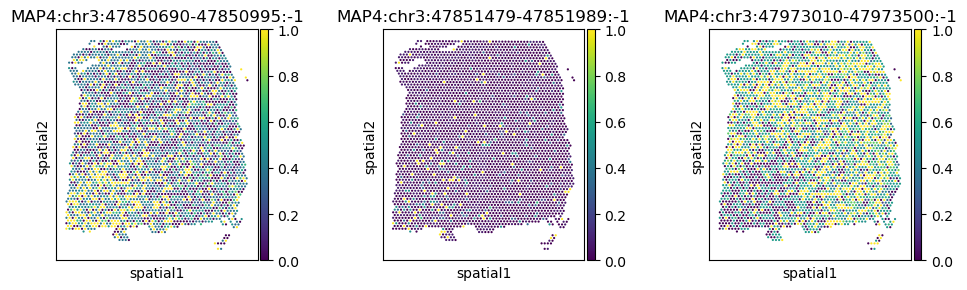

In [285]:
_iso_to_plot = _df.index
_name_to_plot = _df['peak_id']
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
              img_key = 'lowres', alpha_img=0, layer = 'log1p', ncols = len(_iso_to_plot))
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0, layer = 'ratios_obs', ncols = len(_iso_to_plot))

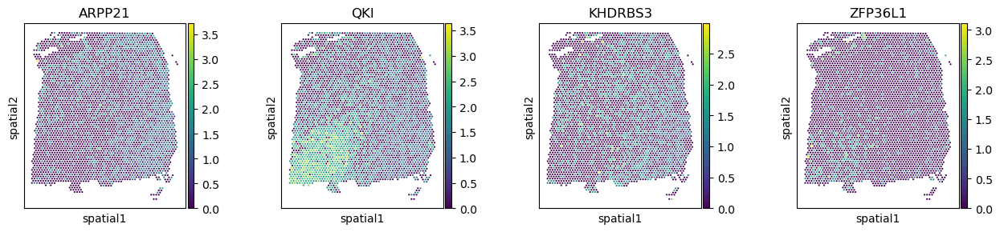

In [286]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = ['ARPP21', 'QKI', 'KHDRBS3', 'ZFP36L1'], img_key = 'lowres', alpha_img=0, layer = 'log1p')

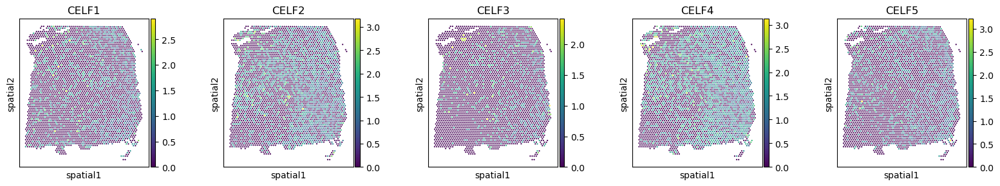

In [287]:
_rbp_to_plot = adata_visium.var_names[adata_visium.var_names.str.startswith('CELF')].sort_values()
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium, color = _rbp_to_plot, ncols=len(_rbp_to_plot),
              img_key = 'lowres', alpha_img=0, layer = 'log1p')

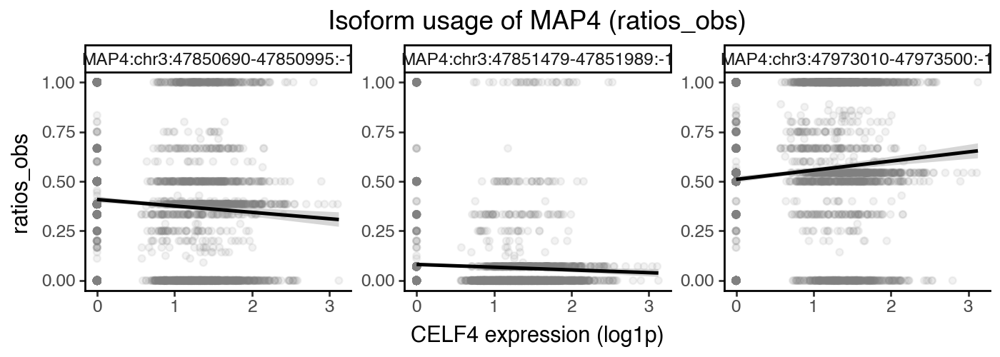

In [288]:
_svs_gene = 'MAP4'
_rbp_gene = 'CELF4'
_svs_layer = 'ratios_obs'
_visium_layer = 'log1p'

# _iso_to_plot = ['RPS']

# Extract RBP expression from 'adata_visium_rbp'
_df = pd.DataFrame({
    _rbp_gene: adata_visium[:, _rbp_gene].layers[_visium_layer].toarray().squeeze(),
})
 
# Extract isoform usage from 'adata_ont_sv'
_iso_to_plot = adata_peak.var.index[adata_peak.var['gene_symbol'] == _svs_gene]
_name_to_plot = adata_peak.var.loc[adata_peak.var['gene_symbol'] == _svs_gene].index

for _ind, _name in zip(_iso_to_plot, _name_to_plot):
    if _svs_layer in ['log1p', 'counts']:
        _df[_name] = adata_peak[:, _ind].layers[_svs_layer].toarray().squeeze()
    else:
        _df[_name] = adata_peak[:, _ind].layers[_svs_layer].squeeze()
 
# Melt the dataframe for ggplot visualization
# Before: columns ['Rbfox3', 'Myl-201', 'Myl-206', 'Myl-211', 'Myl-212']
# After: columns ['Rbfox3', 'isoform', 'ratios_smoothed']
df_ratio2rbp = _df.melt(id_vars=[_rbp_gene], var_name='isoform', value_name=_svs_layer)

(
    ggplot(df_ratio2rbp, aes(x = _rbp_gene, y = _svs_layer)) +
        facet_wrap('~ isoform', scales='free_y', ncol = len(_iso_to_plot)) +
        geom_point(alpha = 0.1, color = 'gray') +
        stat_smooth(method = 'lm') + 
        labs(x = f'{_rbp_gene} expression ({_visium_layer})', title = f'Isoform usage of {_svs_gene} ({_svs_layer})') +
        theme_classic() + 
        theme(figure_size=[7,2.5])
)

#### RPS8

In [33]:
_df = adata_peak.var.loc[adata_peak.var['gene_symbol'] == 'RPS8'].sort_values('position')
_df

,gene_symbol,chr,position,strand,gene_id,Gene,Chr,Strand,Fit.start,Fit.end,PeakClass,OriginalPeak,DataOrigin,exon.intron,exon.pos,n_cells,peak_id
RPS8:chr1:44776092-44777647:1,RPS8,chr1,44776092-44777647,1,RPS8,RPS8,chr1,1,44776092,44777647,Merged,RPS8:chr1:44776092-44777617:1,151508,across-junctions,"(44776092,44776139)(44776675,44776773)(4477761...",2161,RPS8:chr1:44776092-44777647:1
RPS8:chr1:44776701-44778779:1,RPS8,chr1,44776701-44778779,1,RPS8,RPS8,chr1,1,44776701,44778779,Merged,RPS8:chr1:44776737-44778779:1,151508,across-junctions,"(44776737,44776773)(44777614,44777788)(4477800...",3432,RPS8:chr1:44776701-44778779:1
RPS8:chr1:44777629-44778779:1,RPS8,chr1,44777629-44778779,1,RPS8,RPS8,chr1,1,44777629,44778779,Merged,RPS8:chr1:44777673-44778757:1,151507,across-junctions,"(44777673,44777788)(44778000,44778128)(4477857...",3389,RPS8:chr1:44777629-44778779:1


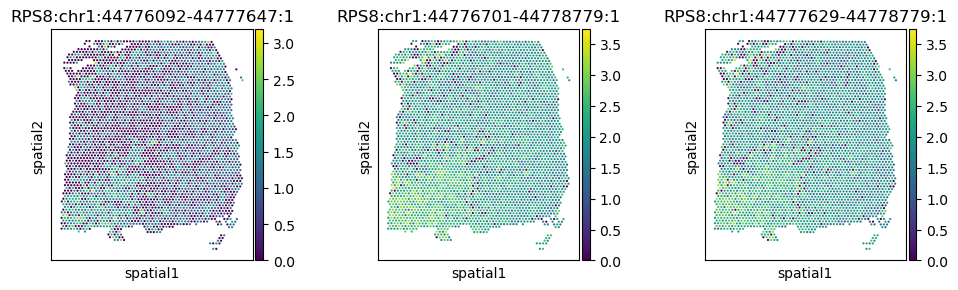

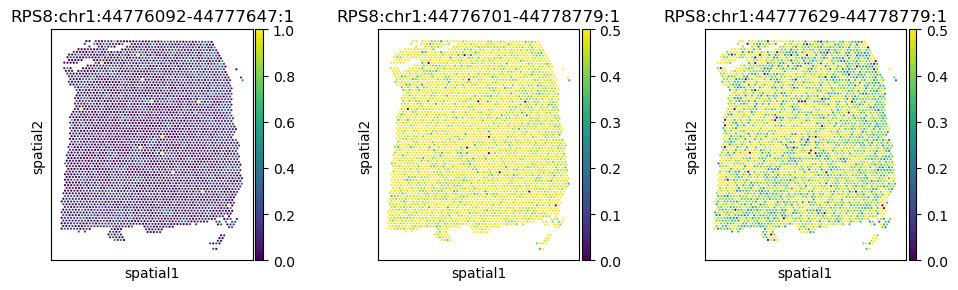

In [34]:
_iso_to_plot = _df.index
_name_to_plot = _df['peak_id']
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
              img_key = 'lowres', alpha_img=0, layer = 'log1p', ncols = len(_iso_to_plot))
    sc.pl.spatial(adata_peak, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0, layer = 'ratios_obs', ncols = len(_iso_to_plot))

### Save expression and ratio data

In [9]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/human_dlpfc/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

sample_id = '151673'

#### Save isoform usage

In [13]:
## save isoform usage per spot
_svs_to_save = ['SEPTIN8', 'MAP4']

df_svs_ratio = []
for _layer in ['log1p', 'ratios_obs', 'ratios_smoothed']:
    df_layer = []
    # loop over SVS genes
    for _svs in _svs_to_save:
        df_svs = adata_peak_sv.obs[['array_row', 'array_col']].reset_index(names = 'barcode')
        _iso_list = adata_peak_sv.var_names[adata_peak_sv.var['gene_symbol'] == _svs]
        for _iso in _iso_list:
            df_svs[_iso] = adata_peak_sv[df_svs['barcode'], _iso].layers[_layer].toarray().squeeze()
        df_svs = df_svs.melt(id_vars=['barcode', 'array_row', 'array_col'], 
                             var_name='isoform', value_name='ratio')
        df_svs['gene'] = _svs
        df_layer.append(df_svs)

    # concatenate all genes
    df_layer = pd.concat(df_layer, axis = 0)
    df_layer['layer'] = _layer
    df_svs_ratio.append(df_layer)

df_svs_ratio = pd.concat(df_svs_ratio, axis = 0)
df_svs_ratio.to_csv(f"{res_dir}/figures/source_data/svs_ratio.csv", index = False)

#### Save RBP expression

In [10]:
# save RBP expression per spot
_rbp_to_save = [f'RBFOX{i+1}' for i in range(3)] + \
    [f'CELF{i+1}' for i in range(5)] + ['QKI', 'KHDRBS3'] + \
    ['ARPP21', 'SRRM4', 'G3BP2', 'TNRC6C', 'YWHAG', 'ZFP36L1', 
     'NOVA1', 'NOVA2', 'PTBP2']

df_rbp_expr = []
for _layer in ['log1p', 'counts']:
    df_expr = adata_peak_sv.obs[['array_row', 'array_col']].reset_index(names = 'barcode')
    for _rbp in _rbp_to_save:
        df_expr[_rbp] = adata_visium[df_expr['barcode'], _rbp].layers[_layer].toarray().squeeze()

    df_expr = df_expr.melt(id_vars=['barcode', 'array_row', 'array_col'], 
                           var_name='gene', value_name='expression')
    df_expr['layer'] = _layer
    df_rbp_expr.append(df_expr)

df_rbp_expr = pd.concat(df_rbp_expr, axis = 0)
df_rbp_expr.to_csv(f"{res_dir}/figures/source_data/rbp_expr.csv", index = False)

## Differential usage (DU) tests

In [ ]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/human_dlpfc/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

### Visualize DU RBP test results

#### Load results of all samples

In [174]:
# process all 12 DLPFC samples
sample_list = [
    '151507', '151508', '151509', '151510', 
    '151669', '151670', '151671', '151672', 
    '151673', '151674', '151675', '151676'
]
df_du_pval = []

for sample_id in sample_list:
    _df = pd.read_csv(f"{res_dir}/du_rbp_results/{sample_id}.du_combined_{date}.csv", index_col=None)
    _df['sample_id'] = sample_id

    # set significance threshold
    _df['is_significant'] = (_df['pvalue_hsic-gp'] < 0.05) & (_df['pvalue_glmm'] < 0.05)

    df_du_pval.append(_df)

# merge SV results for all samples and reset the index
df_du_pval = pd.concat(df_du_pval).reset_index(drop=True)

In [175]:
df_du_pval.groupby(['sample_id', 'is_significant']).size()

sample_id  is_significant
151507     False              3385
           True                 60
151508     False              1417
           True                 18
151509     False              2898
           True                 54
151510     False              2860
           True                 56
151669     False              6124
           True                 86
151670     False              5503
           True                 59
151671     False              9243
           True                131
151672     False              4972
           True                 68
151673     False             42147
           True                633
151674     False             62820
           True                864
151675     False             33349
           True                599
151676     False             29653
           True                477
dtype: int64

#### Rank RBP-SVS pairs based on re-occurrence and min-pval

In [251]:
df_du_rbp = df_du_pval[df_du_pval['is_significant']]

# HSIC-GP has some extremely small p-values, 
# so for visualization purpose we rank pairs by GLMM pvalues instead
# find the sample with minimal p-value and extract the corresponding rows
idx_min_padj = df_du_rbp.groupby(["gene", "covariate"])["pvalue_glmm"].idxmin()
minimal_rows = df_du_rbp.loc[idx_min_padj]

# group by gene, count occurrence, and aggregate all info
row_counts = df_du_rbp.groupby(["gene", "covariate"]).size().rename("occurrence")
aggregated = df_du_rbp.groupby(["gene", "covariate"]).agg(
    is_sig_in=("sample_id", lambda x: list(x.unique())),  # Collect unique sample IDs
)
aggregated["occurrence"] = row_counts

df_du_rbp = aggregated.join(minimal_rows.set_index(["gene", "covariate"])).sort_values(
    by=['occurrence', 'pvalue_glmm'], ascending=[False, True]
)[['occurrence', 'is_sig_in', 'sample_id', 
   'pvalue_hsic', 'pvalue_hsic-gp', 'pvalue_glm', 'pvalue_glmm', 
]]

df_du_rbp.head()

,,occurrence,is_sig_in,sample_id,pvalue_hsic,pvalue_hsic-gp,pvalue_glm,pvalue_glmm
gene,covariate,,,,,,,
NCAM1,QKI,7,"[151507, 151509, 151510, 151673, 151674, 15167...",151673,1.295583e-36,1.282955e-03,0.000000e+00,0.000000
RBFOX2,RBFOX2,6,"[151507, 151671, 151673, 151674, 151675, 151676]",151507,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
GPM6B,YWHAG,5,"[151507, 151509, 151510, 151673, 151674]",151673,5.873117e-20,2.845744e-06,6.825933e-09,0.000022
EIF3H,EIF3H,4,"[151673, 151674, 151675, 151676]",151673,7.292199e-259,1.939657e-263,0.000000e+00,0.000000
IL6ST,HNRNPH1,4,"[151671, 151673, 151674, 151676]",151673,3.425511e-05,1.273290e-04,4.367591e-04,0.000537


In [252]:
(df_du_rbp['occurrence'] >= 2).sum(), df_du_rbp.shape[0]

(113, 2963)

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


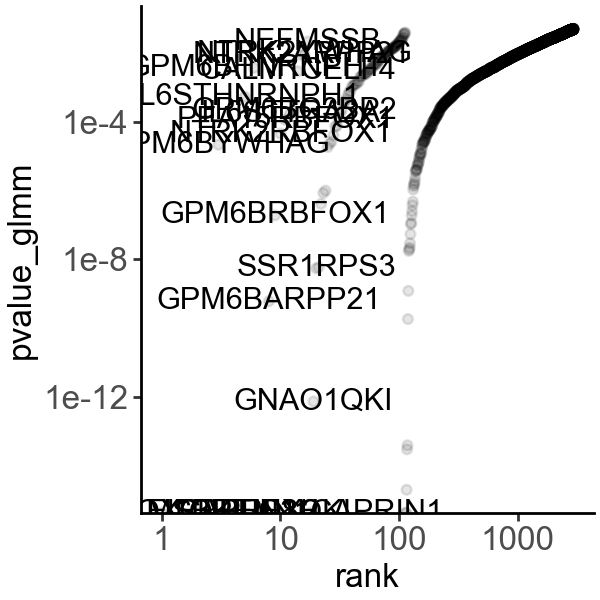

In [253]:
df = df_du_rbp.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_glmm')) +
        geom_point(alpha = 0.1) + 
        geom_text(df.head(n = 20), aes(label = 'gene+covariate')) +
        # geom_point(df.loc[df['gene'] == 'SEPTIN8'].head(n = 5), aes(label = 'covariate'), color = 'red') + 
        # geom_text(df.loc[df['gene'] == 'SEPTIN8'].head(n = 5), aes(label = 'covariate')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        # ylim(1e-50, 1e-3) + 
        theme_classic() + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### SEPTIN8

In [254]:
df = df_du_rbp.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
df_selected = df.loc[df['gene'] == 'SEPTIN8']
df_selected

,rank,gene,covariate,occurrence,is_sig_in,sample_id,pvalue_hsic,pvalue_hsic-gp,pvalue_glm,pvalue_glmm
6,7,SEPTIN8,QKI,3,"[151672, 151673, 151674]",151673,4.330400e-56,0.014653,0.000000e+00,0.000000e+00
21,22,SEPTIN8,SRRM4,2,"[151673, 151676]",151673,1.324551e-07,0.011081,5.693869e-10,4.116547e-07
28,29,SEPTIN8,G3BP2,2,"[151675, 151676]",151675,2.025394e-08,0.042191,1.757605e-06,7.386078e-05
84,85,SEPTIN8,TNRC6C,2,"[151675, 151676]",151676,3.701054e-03,0.022949,4.136972e-03,1.295124e-02
126,127,SEPTIN8,CELF3,1,[151673],151673,4.257275e-08,0.039849,1.449996e-11,1.148655e-07
128,129,SEPTIN8,CELF2,1,[151673],151673,3.559112e-10,0.042851,3.966416e-11,2.517401e-07
130,131,SEPTIN8,YWHAG,1,[151673],151673,1.774157e-31,0.012183,8.150314e-11,4.784836e-07
180,181,SEPTIN8,LSM11,1,[151673],151673,5.378664e-04,0.027688,2.251392e-06,5.752939e-05
186,187,SEPTIN8,RBFOX2,1,[151676],151676,2.286991e-07,0.008318,2.589369e-06,7.041846e-05
191,192,SEPTIN8,FTO,1,[151675],151675,1.102610e-05,0.005530,4.175373e-06,9.419273e-05


/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


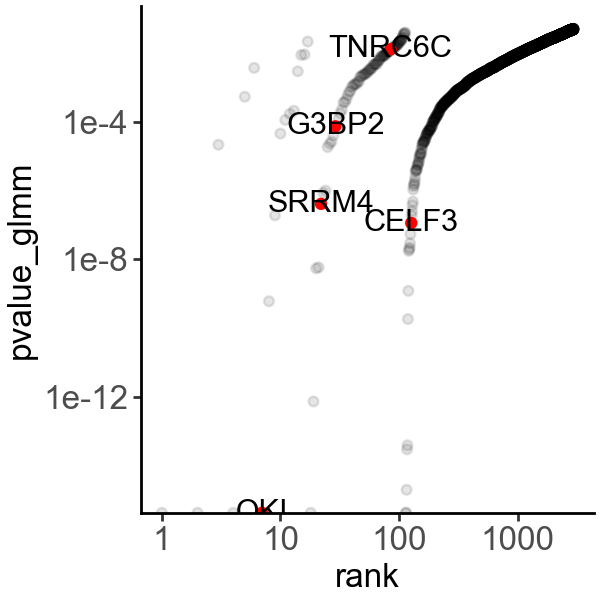

In [255]:
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_glmm')) +
        geom_point(alpha = 0.1) + 
        geom_point(df_selected.head(n = 5), aes(label = 'covariate'), color = 'red') + 
        geom_text(df_selected.head(n = 5), aes(label = 'covariate')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        # ylim(1e-50, 1e-3) + 
        theme_classic() + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### MAP4

In [256]:
df = df_du_rbp.reset_index().reset_index(names = 'rank')
df['rank'] = df['rank'] + 1
df_selected = df.loc[df['gene'] == 'MAP4']
df_selected

,rank,gene,covariate,occurrence,is_sig_in,sample_id,pvalue_hsic,pvalue_hsic-gp,pvalue_glm,pvalue_glmm
25,26,MAP4,CELF4,2,"[151674, 151675]",151674,6.688789e-12,0.000750,1.170019e-06,2.308066e-05
34,35,MAP4,ARPP21,2,"[151509, 151676]",151676,2.306187e-05,0.046814,5.271393e-05,3.745266e-04
116,117,MAP4,QKI,1,[151675],151675,2.917987e-16,0.040345,1.110223e-16,2.997602e-14
121,122,MAP4,ZFP36L1,1,[151673],151673,3.104388e-07,0.046593,1.415554e-10,1.947060e-08
146,147,MAP4,KHDRBS3,1,[151673],151673,1.234125e-06,0.012452,7.828112e-07,6.826020e-06
149,150,MAP4,CELF3,1,[151673],151673,2.584152e-06,0.018834,8.729277e-07,1.042453e-05
166,167,MAP4,RBFOX1,1,[151675],151675,2.366024e-07,0.034558,3.486254e-06,3.182025e-05
280,281,MAP4,TNRC6C,1,[151676],151676,8.500753e-02,0.028825,6.110403e-04,5.631868e-04
473,474,MAP4,YWHAG,1,[151673],151673,1.517795e-21,0.005582,4.834598e-04,2.311298e-03
651,652,MAP4,UTP3,1,[151676],151676,1.960030e-03,0.001428,2.755857e-03,4.138302e-03


/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


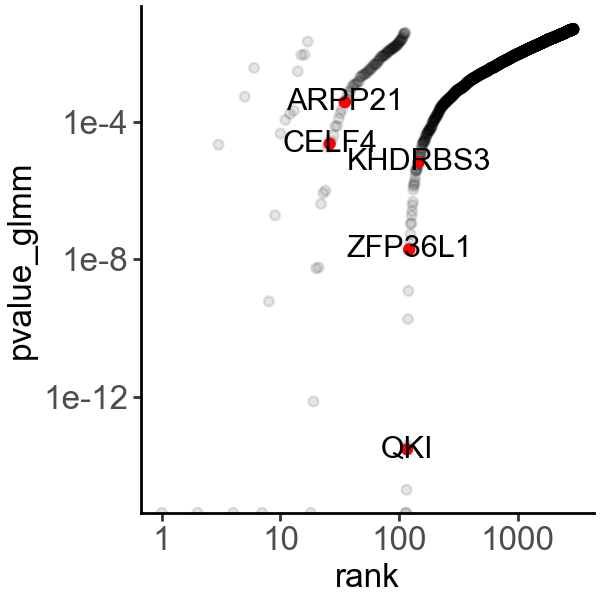

In [257]:
(
    ggplot(df, aes(x = 'rank', y = 'pvalue_glmm')) +
        geom_point(alpha = 0.1) + 
        geom_point(df_selected.head(n = 5), aes(label = 'covariate'), color = 'red') + 
        geom_text(df_selected.head(n = 5), aes(label = 'covariate')) + 
        scale_y_log10() + 
        scale_x_log10() + 
        # ylim(1e-50, 1e-3) + 
        theme_classic() + 
        theme(
            figure_size=(3,3),
            text=element_text(size = 12, family = 'Arial')
        )
)

#### Save the aggregated results

In [258]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

df_du_rbp.to_csv(f"{res_dir}/trend_du_rbp_dlpfc_{date}.csv")

### Check DU agreements

#### Between replicates

In [209]:
df_stat_rep = []
for id1, id2 in [
    ('151507', '151508'), ('151509', '151510'),
    ('151669', '151670'), ('151671', '151672'), 
    ('151673', '151674'), ('151675', '151676'),
]:
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/du_rbp_results/{id1}.du_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/du_rbp_results/{id2}.du_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = ['gene', 'covariate'])

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['pvalue_glm', 'pvalue_glmm', 'pvalue_hsic', 'pvalue_hsic-gp']:
        # _g = (_df_pair[f'{_stat}_x'] < 0.05) & (_df_pair[f'{_stat}_y'] < 0.05)
        # _df = _df_pair.loc[_g]
        _df = _df_pair
        _df_stat.append({
            'n_svs': _df['gene'].nunique(),
            'n_rbp': _df['covariate'].nunique(),
            'stat': _stat,
            'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
            'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
        })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_rep.append(_df_stat)

df_stat_rep = pd.concat(df_stat_rep)

In [210]:
df_stat_rep

,n_svs,n_rbp,stat,spearmannr,pval
0,22,30,pvalue_glm,0.278641,3.106284e-13
1,22,30,pvalue_glmm,0.258403,1.576178e-11
2,22,30,pvalue_hsic,0.282681,1.362860e-13
3,22,30,pvalue_hsic-gp,0.154175,6.975246e-05
0,27,29,pvalue_glm,0.301596,6.269958e-18
1,27,29,pvalue_glmm,0.276789,3.085870e-15
2,27,29,pvalue_hsic,0.280161,1.377325e-15
3,27,29,pvalue_hsic-gp,0.059772,9.464751e-02
0,16,187,pvalue_glm,0.071697,8.666383e-05
1,16,187,pvalue_glmm,0.138165,3.179899e-14


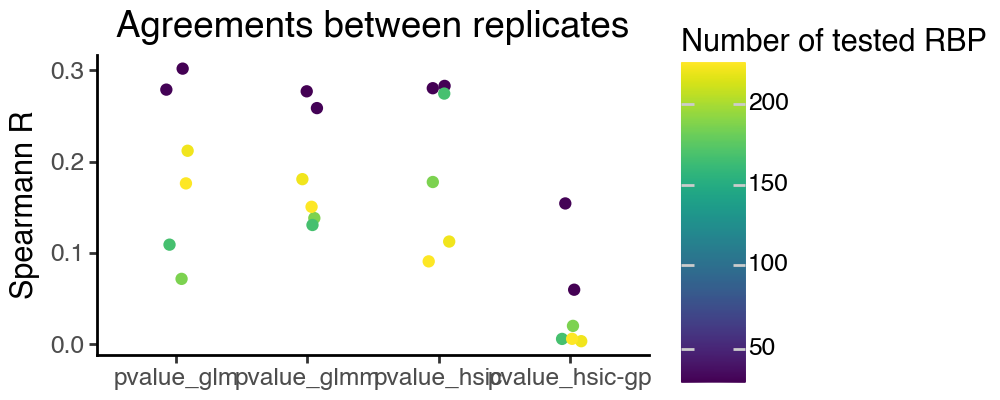

In [217]:
(
    ggplot(df_stat_rep, aes(x = 'stat', y = 'spearmannr', color = 'n_rbp')) + 
        geom_jitter(width = 0.1) + 
        labs(x = '', y = 'Spearmann R', color = 'Number of tested RBP', title = 'Agreements between replicates') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Between positions of the same individual

In [218]:
df_stat_pos = []
for id1, id2 in (
    list(itertools.product(('151507', '151508'), ('151509', '151510'))) + \
    list(itertools.product(('151669', '151670'), ('151671', '151672'))) + \
    list(itertools.product(('151673', '151674'), ('151675', '151676')))
):
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/du_rbp_results/{id1}.du_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/du_rbp_results/{id2}.du_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = ['gene', 'covariate'])

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['pvalue_glm', 'pvalue_glmm', 'pvalue_hsic', 'pvalue_hsic-gp']:
        # _g = (_df_pair[f'{_stat}_x'] < 0.05) & (_df_pair[f'{_stat}_y'] < 0.05)
        # _df = _df_pair.loc[_g]
        _df = _df_pair
        _df_stat.append({
            'n_svs': _df['gene'].nunique(),
            'n_rbp': _df['covariate'].nunique(),
            'stat': _stat,
            'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
            'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
        })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_pos.append(_df_stat)

df_stat_pos = pd.concat(df_stat_pos)

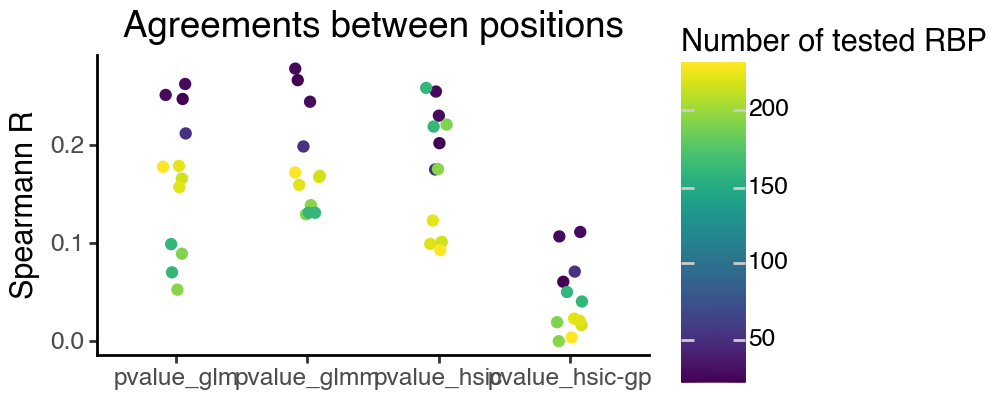

In [219]:
(
    ggplot(df_stat_pos, aes(x = 'stat', y = 'spearmannr', color = 'n_rbp')) + 
        geom_jitter(width = 0.1) + 
        labs(x = '', y = 'Spearmann R', color = 'Number of tested RBP', title = 'Agreements between positions') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Between individuals

In [220]:
df_stat_indiv = []
for id1, id2 in (
    list(itertools.product(('151507', '151508', '151509', '151510'), 
                           ('151669', '151670', '151671', '151672'))) +
    list(itertools.product(('151669', '151670', '151671', '151672'),
                           ('151673', '151674', '151675', '151676'))) +
    list(itertools.product(('151507', '151508', '151509', '151510'),
                           ('151673', '151674', '151675', '151676')))
    
):
    # load SV results
    _df1 = pd.read_csv(f"{res_dir}/du_rbp_results/{id1}.du_combined_{date}.csv", index_col=None)
    _df2 = pd.read_csv(f"{res_dir}/du_rbp_results/{id2}.du_combined_{date}.csv", index_col=None)
    _df_pair = pd.merge(_df1, _df2, how='inner', on = ['gene', 'covariate'])

    # calculate spearmann r for each statistics
    _df_stat = []
    for _stat in ['pvalue_glm', 'pvalue_glmm', 'pvalue_hsic', 'pvalue_hsic-gp']:
        # _g = (_df_pair[f'{_stat}_x'] < 0.05) & (_df_pair[f'{_stat}_y'] < 0.05)
        # _df = _df_pair.loc[_g]
        _df = _df_pair
        _df_stat.append({
            'n_svs': _df['gene'].nunique(),
            'n_rbp': _df['covariate'].nunique(),
            'stat': _stat,
            'spearmannr': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[0],
            'pval': spearmanr(_df[f'{_stat}_x'], _df[f'{_stat}_y'])[1]
        })

    _df_stat = pd.DataFrame(_df_stat)
    df_stat_indiv.append(_df_stat)

df_stat_indiv = pd.concat(df_stat_indiv)

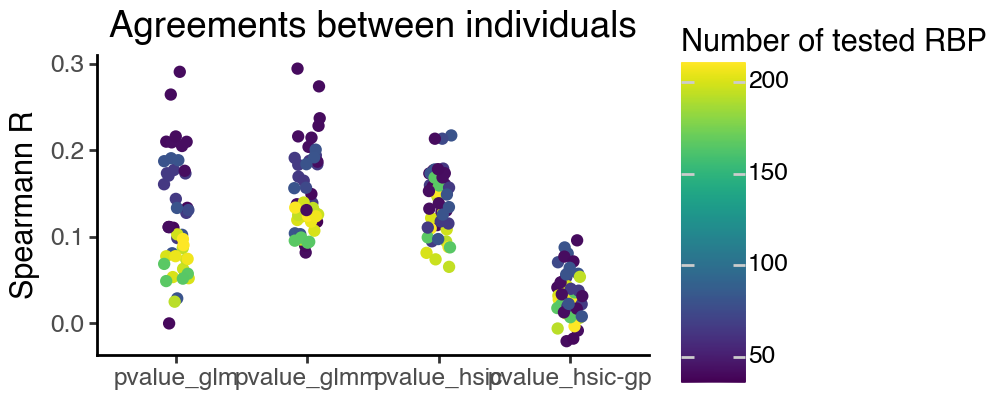

In [221]:
(
    ggplot(df_stat_indiv, aes(x = 'stat', y = 'spearmannr', color = 'n_rbp')) + 
        geom_jitter(width = 0.1) + 
        labs(x = '', y = 'Spearmann R', color = 'Number of tested RBP', title = 'Agreements between individuals') + 
        theme_classic() + 
        theme(figure_size=[5,2])
)

#### Combined visualization

In [222]:
df_stat = pd.concat([
    df_stat_rep.assign(comp='replicates (n=6)'),
    df_stat_pos.assign(comp='positions (n=12)'),
    df_stat_indiv.assign(comp='individuals (n=48)')
])
df_stat['comp'] = pd.Categorical(df_stat['comp'], ordered=True, categories=[
    'replicates (n=6)', 'positions (n=12)', 'individuals (n=48)'
])

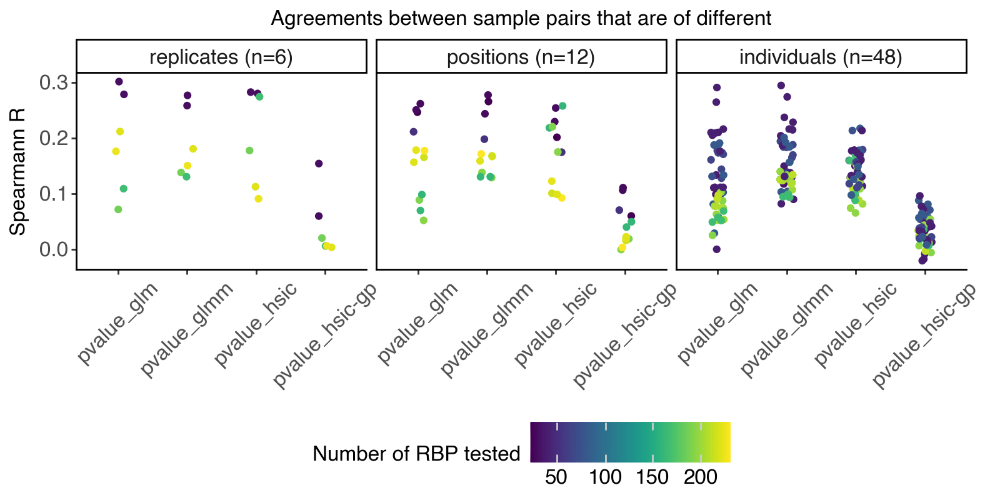

In [225]:
(
    ggplot(df_stat, aes(x = 'stat', y = 'spearmannr', color = 'n_rbp')) + 
        facet_wrap('~comp') + 
        geom_jitter(width = 0.1) +
        labs(x = '', y = 'Spearmann R', color = 'Number of RBP tested', title = 'Agreements between sample pairs that are of different') + 
        theme_classic() + 
        theme(
            figure_size=[8,4],
            legend_position='bottom',
            text=element_text(size=12),
            axis_text_x=element_text(rotation=45)
        )
)

#### Save aggregated results

In [224]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/human_dlpfc/"
date = '0123'

df_stat.to_csv(f"{res_dir}/figures/source_data/du_agreements_stat_{date}.csv", index=False)